# Dataset

In [1]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

In [2]:
# %load_ext autoreload
# %autoreload 2
import os
from archetypes import *
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import matplotlib.colors as mcolors

In [3]:
# RGB values for each region
region_color = {
    "Ocean": (0.2154516905067, 0.295, 0.5078367867510504),
    "Desert": (0.78, 0.51, 0.1892045842),
    "Biogenic": (0.12071162840208301, 0.4357915995132193, 0.2463679091477368),
    "Urban": (0.7, 0.7, 0.65),
    "Almost Polar": (0.5184891135337089, 0.7194769933793438, 0.7518803726887796),
    "Polar": (0.5632111255041908, 0.758620966612444, 0.7764634182455044)
}

# Region for each location
location_to_region = {
    'Amazon': 'Biogenic',
    'AtlanticOcean': 'Ocean',
    'Beijing': 'Urban',
    'Borneo': 'Biogenic',
    'CapeGrim': 'Polar',
    'Congo': 'Biogenic',
    'ElDjouf': 'Desert',
    'Graciosa': 'Ocean',
    'IndianOcean': 'Ocean',
    'Kinshasa': 'Urban',
    'LosAngeles': 'Urban',
    'McMurdo': 'Polar',
    'Ozarks': 'Biogenic',
    'PacificOcean': 'Ocean',
    'Paris': 'Urban',
    'Utqiagvik': 'Almost Polar'
}

In [4]:
class ChemicalCase:
    def __init__(self, filename):
        self.filename = filename
        self.parse_file()
        self.record = [self.timestamp, self.longitude, self.latitude, self.level, self.temperature, self.pressure, self.air_number_density, self.average_water, self.cloud_fraction, self.cos_sza, self.kpp_h_val, self.internal_timesteps 
] + self.concentrations + self.reaction_rates + self.rate_constants

    def parse_file(self):
        with open(self.filename, 'r') as f:
            lines = f.readlines()
            for i, line in enumerate(lines):
                if line.startswith('Meteorological Fields'):
                    self.parse_meteorological_fields(lines[i+1:])
                elif line.startswith('Integrator-specific parameters'):
                    self.parse_integrator_specific_parameters(lines[i+1:])
                elif line.startswith('Chemical state'):
                    self.parse_chemical_state(lines[i+1:])

    def parse_meteorological_fields(self, lines):
        self.timestamp = lines[0].split('Timestamp:')[1].strip()
        self.longitude = float(lines[1].split(':')[1].strip())
        self.latitude = float(lines[2].split(':')[1].strip())
        self.level = int(lines[3].split(':')[1].strip())
        self.temperature = float(lines[4].split(':')[1].strip())
        self.pressure = float(lines[5].split(':')[1].strip())
        self.air_number_density = float(lines[6].split(':')[1].strip())
        self.average_water = float(lines[7].split(':')[1].strip())
        self.cloud_fraction = float(lines[8].split(':')[1].strip())
        self.cos_sza = float(lines[9].split(':')[1].strip())

    def parse_integrator_specific_parameters(self, lines):
        self.kpp_h_val = float(lines[0].split(':')[1].strip())
        self.internal_timesteps = int(float(lines[0-1].split(':')[1].strip()))
    
    def parse_chemical_state(self, lines):
        # obin: Based on Emy's code for parsing all values
        self.concentrations = []
        self.rate_constants = []
        self.reaction_rates = []
        for line in lines:
            if line.startswith(' C('):
                parts = line.split('=')
                value = float(parts[1].strip())
                self.concentrations.append(value)
            elif line.startswith(' R('):
                parts = line.split('=')
                value = float(parts[1].strip())
                self.rate_constants.append(value)
            elif line.startswith(' A('):
                parts = line.split('=')
                value = float(parts[1].strip())
                self.reaction_rates.append(value)

In [5]:
#For categorical
# categorical = True, legend_color = dictionary with keys as labels and values as colors
# For continuous
# categorical = False, legend_color = array of values according to which to color and cmap as name of color map to use

def plot_simplex(n_archetypes, alfa, color_vertex, plot_args={}, grid_on=True, cmap='viridis', categorical=True, legend_color=None, label = True):
    vertex_colors = ['red', 'blue', 'green', 'yellow']
    labels = ('A'+str(i + 1) for i in range(n_archetypes))
    rotate_labels = True
    label_offset = 0.10
    data = alfa.T
    scaling = False
    sides = n_archetypes
    basis = np.array(
        [
            [
                np.cos(2*_*pi/sides + 90*pi/180),
                np.sin(2*_*pi/sides + 90*pi/180)
            ] 
            for _ in range(sides)
        ]
    )     

    # If data is Nxsides, newdata is Nx2.
    if scaling:
        # Scales data for you.
        newdata = np.dot((data.T / data.sum(-1)).T, basis)
    else:
        # Assumes data already sums to 1.
        newdata = np.dot(data, basis)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111)

    for i, l in enumerate(labels):
        if i >= sides:
            break
        x = basis[i, 0]
        y = basis[i, 1]
        if rotate_labels:
            angle = 180*np.arctan(y/x)/pi + 90
            if angle > 90 and angle <= 270:
                angle = (angle + 180) % 360
        else:
            angle = 0
        ax.text(
            x*(1 + label_offset),
            y*(1 + label_offset),
            l,
            horizontalalignment='center',
            verticalalignment='center',
            rotation=angle
        )

    # Clear normal matplotlib axes graphics.
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_frame_on(False)

    # Plot border
    lst_ax_0 = []
    lst_ax_1 = []
    for _ in range(sides):
        lst_ax_0.append(basis[_, 0])
        lst_ax_1.append(basis[_, 1])

    lst_ax_0.append(basis[0, 0])
    lst_ax_1.append(basis[0, 1])

    ax.plot(lst_ax_0, lst_ax_1, linewidth=1, zorder=2) 
    
    # Plot vertices
    if color_vertex:
        for i in range(len(color_vertex)):
            v = color_vertex[i]
            ax.scatter(basis[v, 0], basis[v, 1], color=vertex_colors[i], s=200, zorder=4)

    if len(plot_args) == 0:
        ax.scatter(newdata[:, 0], newdata[:, 1], color='black', zorder=3, alpha=0.5)
    else:
        if ('marker' in plot_args):   
            marker_vals = plot_args['marker'].values
            marker_unq = np.unique(marker_vals)                
            
            for marker in marker_unq:
                row_idx = np.where(marker_vals == marker)
                tmp_arg = {}
                for keys in plot_args:
                    if (keys!= 'marker'):
                        tmp_arg[keys] = plot_args[keys].values[row_idx]
                
                ax.scatter(newdata[row_idx,0],newdata[row_idx,1], **tmp_arg, marker =  marker, alpha=0.5, zorder=3)
        else:
            if categorical:
                ax.scatter(newdata[:, 0], newdata[:, 1], **plot_args, marker='s', zorder=3, alpha=0.5)
            else:
                values = legend_color
                # Normalize the values
                norm = Normalize(vmin=min(values), vmax=max(values))
                # Choose a colormap
                cmap = cm.get_cmap(cmap)
                # Map each normalized value to a color
                colors = [cmap(norm(value)) for value in values]
                plot_args['color'] = colors
                
                ax.scatter(newdata[:, 0], newdata[:, 1], **plot_args, marker='s', zorder=3, alpha=0.5)
                
        
    if label:    
        # Add color bar if numerical data
        if not categorical:

            values = legend_color
            # Normalize the values
            norm = Normalize(vmin=min(values), vmax=max(values))

            # Create a ScalarMappable object using a colormap and the normalized values
            scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

            # Create an inset axis for the colorbar
            cb_ax = ax.inset_axes([1.15, 0.5, 0.05, 0.4])  # Adjust the position and size as needed

            # Add the colorbar to the inset axis
            colorbar = plt.colorbar(scalar_map, cax=cb_ax, orientation='vertical', label=label)

            # Adjust colorbar properties
            colorbar.minorticks_on()  # Show minor ticks
            colorbar.alpha = 0.5  # Set transparency


        else:
            legend_labels =  legend_color.keys() # Update with actual labels
            legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in legend_color.values()]
    #         ax.legend(legend_handles, legend_labels, loc='lower right')
            ax.legend(legend_handles, legend_labels, loc='lower right', bbox_to_anchor=(1.15, 0.5))

            
    plt.show()

In [ ]:
import os

folder_path = 'samples/'

# Create a dictionary with filename as keys and concentrations as objects
data = {}
# List all files in the folder and subdirectories
for root, dirs, files in os.walk(folder_path):
    for file in files:
        print(os.path.join(root, file))
        chemical_case = ChemicalCase(os.path.join(root,file))
        record = chemical_case.record
        data[file] = file.split('_')[0:1] + record

# Convert the dictionary to a DataFrame
df = pd.DataFrame.from_dict(data, orient='index')

df.columns = ['location','timestamp', 'longitude', 'latitude', 'level', 'temperature', 'pressure', 'air_number_density', 'average_water', 'cloud_fraction', 'cos_sza', 'kpp_h_val', 'internal_timesteps' 
] + ['C' + str(i) for i in range(1,291+1)] + ['R' + str(i) for i in range(1,913+1)] + ['K' + str(i) for i in range(1,913+1)] 

# Add a new column 'twilight' to df_lower
df['twilight'] = df['location'].apply(lambda x: True if 'twilight' in x.lower() else False)

# Modify location names to remove 'twilight'
df['location'] = df['location'].apply(lambda x: x.split('_')[0].replace('Twilight', ''))

# Adding the 'region' column based on the 'location' column
df['region'] = df['location'].map(location_to_region)

# Set the filename as the index name
df.index.name = 'filename'

df.to_csv('GEOS_CF_dataset.csv', index=True)

In [6]:
df = pd.read_csv('GEOS_CF_dataset.csv', index_col='filename')
df.head()

,location,timestamp,longitude,latitude,level,temperature,pressure,air_number_density,average_water,cloud_fraction,...,K906,K907,K908,K909,K910,K911,K912,K913,twilight,region
filename,,,,,,,,,,,,,,,,,,,,,
AmazonTwilight_L10_20180101_2145.txt,Amazon,2018/01/01 21:45,-62.3631,-3.071,10,291.83,858.5508,2.097000e+19,0.02261,0.000094,...,9.194149e-08,4.366680e-06,1.759491e-06,3.077669e-07,1.326652e-06,3.077669e-07,3.077669e-07,1.265506e-06,True,Biogenic
AmazonTwilight_L10_20180101_2200.txt,Amazon,2018/01/01 22:00,-62.3631,-3.071,10,291.79,858.6730,2.098000e+19,0.02258,0.000083,...,3.169007e-08,1.511636e-06,5.944569e-07,1.093729e-07,4.614411e-07,1.093729e-07,1.093729e-07,4.268394e-07,True,Biogenic
AmazonTwilight_L10_20180101_2215.txt,Amazon,2018/01/01 22:15,-62.3631,-3.071,10,291.79,858.5559,2.098000e+19,0.02260,0.000000,...,4.837509e-09,2.250509e-07,9.211448e-08,1.783656e-08,6.799260e-08,1.783656e-08,1.783656e-08,6.623628e-08,True,Biogenic
AmazonTwilight_L10_20180101_2230.txt,Amazon,2018/01/01 22:30,-62.3631,-3.071,10,291.78,858.6656,2.098000e+19,0.02259,0.000047,...,1.609501e-10,7.477167e-09,3.080839e-09,5.565965e-10,2.258006e-09,5.565965e-10,5.565965e-10,2.220224e-09,True,Biogenic
AmazonTwilight_L10_20180102_0930.txt,Amazon,2018/01/02 09:30,-62.3631,-3.071,10,290.06,860.1269,2.114000e+19,0.02196,0.256800,...,5.514297e-11,2.634032e-09,1.047952e-09,2.160709e-10,8.004517e-10,2.160709e-10,2.160709e-10,7.493080e-10,True,Biogenic


In [ ]:
[i for i in df.columns]

In [ ]:
df['internal_timesteps']

In [ ]:
df[['C' + str(i) for i in range(1,291+1)]]

In [ ]:
df['C2']

# PCA

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

input_df = df[['C' + str(i) for i in range(1,291+1)]].copy()

# Assuming df is your DataFrame
# First, let's scale the data
scaler = StandardScaler()
scaled_df = scaler.fit_transform(input_df)

# Then, we perform PCA
pca = PCA()
pca.fit(scaled_df)

# Now, let's get the principal components
pc_df = pd.DataFrame(pca.components_, columns=input_df.columns)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative explained variance ratio
cumulative_explained_variance_ratio = explained_variance_ratio.cumsum()

# Optionally, you can specify the number of components you want to keep
# pca = PCA(n_components=desired_number)
# pca.fit(scaled_df)
# transformed_data = pca.transform(scaled_df)

# Now, you can work with pc_df, explained_variance_ratio, cumulative_explained_variance_ratio,
# and transformed_data as needed.

In [ ]:
import matplotlib.pyplot as plt

# Extract PC1 and PC2 values
pc1_values = pc_df.iloc[0]
pc2_values = pc_df.iloc[1]

# Plot PC1 vs PC2
plt.scatter(pc1_values, pc2_values)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PC1 vs PC2 Plot')
plt.show()

# Analysis on all the data - Concentrations

In [ ]:
lst_feat = ['C' + str(i) for i in range(1,291+1)]

sc = StandardScaler()
X = df[lst_feat].values
X_scaled = sc.fit_transform(X)

AA_list=[]
lst_exp_var = []
for i in range(3,9):
    AA = ArchetypalAnalysis(n_archetypes = i, 
                            tolerance = 0.001, 
                            max_iter = 200, 
                            random_state = 0, 
                            C = 0.0001, 
                            initialize = 'random',
                            redundancy_try = 30)
    AA.fit(X_scaled)
    AA_list.append(AA)
    lst_exp_var.append(AA.explained_variance_)
    
#explained variance
n_archs = list(range(3, 9))
plt.style.use('seaborn')
plt.plot(n_archs, lst_exp_var, '-o')
plt.xlabel('Number of Archetypes')
plt.ylabel('Explained Variance')
plt.show()
    
#coloring 
num_colors = 6
# Define the range of blue hues
start_color = np.array(mcolors.to_rgb('navy'))
end_color = np.array(mcolors.to_rgb('lightblue'))
# Generate a gradient of blue hues
colors = [mcolors.to_hex(start_color + (i / (num_colors - 1)) * (end_color - start_color)) for i in range(num_colors)]
# Create a dictionary mapping unique levels to colors
uniq_levels = sorted(df['level'].unique())
color_dict = {level: color for level, color in zip(uniq_levels, colors)}
# Map the dictionary to the 'level' column to assign colors
df_args = df[['level']].copy()
df_args['color'] = df_args['level'].map(color_dict)
plot_args = {'color': df_args['color']}
color_dict = {'Level '+str(level): color for level, color in zip(uniq_levels, colors)}

#simplex plots    
arr1 = AA_list[1].archetypes.T
color_indices = []
for AA in AA_list[1:]:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict)

# Divide the concentrations by Air number density and apply Analysis

In [ ]:
concentration_df = df[['C' + str(i) for i in range(1,291+1)]+['air_number_density']].copy()
concentration_df = concentration_df.div(df['air_number_density'], axis=0)
concentration_df = concentration_df.drop(columns=['air_number_density'])

concentration_df.head()

In [ ]:
(1.107667e-19/2.097000e+19) #== 1.289311e-39

In [ ]:
concentration_df = concentration_df.div(df['air_number_density'], axis=0)
concentration_df = concentration_df.drop(columns=['air_number_density'])

concentration_df.head()

In [ ]:
lst_feat = ['C' + str(i) for i in range(1,291+1)]

sc = StandardScaler()
X = concentration_df[lst_feat].values #Using concentration_df here
X_scaled = sc.fit_transform(X)

AA_list=[]
lst_exp_var = []
for i in range(3,9):
    AA = ArchetypalAnalysis(n_archetypes = i, 
                            tolerance = 0.001, 
                            max_iter = 200, 
                            random_state = 0, 
                            C = 0.0001, 
                            initialize = 'random',
                            redundancy_try = 30)
    AA.fit(X_scaled)
    AA_list.append(AA)
    lst_exp_var.append(AA.explained_variance_)
    
#explained variance
n_archs = list(range(3, 9))
plt.style.use('seaborn')
plt.plot(n_archs, lst_exp_var, '-o')
plt.xlabel('Number of Archetypes')
plt.ylabel('Explained Variance')
plt.show()
    
#coloring - Level
num_colors = 6
# Define the range of blue hues
start_color = np.array(mcolors.to_rgb('navy'))
end_color = np.array(mcolors.to_rgb('lightblue'))
# Generate a gradient of blue hues
colors = [mcolors.to_hex(start_color + (i / (num_colors - 1)) * (end_color - start_color)) for i in range(num_colors)]
# Create a dictionary mapping unique levels to colors
uniq_levels = sorted(df['level'].unique())
color_dict = {level: color for level, color in zip(uniq_levels, colors)}
# Map the dictionary to the 'level' column to assign colors
df_args = df[['level']].copy()
df_args['color'] = df_args['level'].map(color_dict)
plot_args = {'color': df_args['color']}
color_dict = {'Level '+str(level): color for level, color in zip(uniq_levels, colors)}

#simplex plots    
arr1 = AA_list[1].archetypes.T
color_indices = []
for AA in AA_list[1:]:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict)

# Analysis on level - 1 concentrations

In [7]:
level1_df = df[df['level']==1]
level1_df

,location,timestamp,longitude,latitude,level,temperature,pressure,air_number_density,average_water,cloud_fraction,...,K906,K907,K908,K909,K910,K911,K912,K913,twilight,region
filename,,,,,,,,,,,,,,,,,,,,,
AmazonTwilight_L1_20180101_2145.txt,Amazon,2018/01/01 21:45,-62.3631,-3.071,1,300.72,993.7992,2.351000e+19,0.034260,0.0000,...,6.739687e-08,3.204034e-06,1.289374e-06,2.304834e-07,9.733990e-07,2.304834e-07,2.304834e-07,9.266693e-07,True,Biogenic
AmazonTwilight_L1_20180101_2200.txt,Amazon,2018/01/01 22:00,-62.3631,-3.071,1,300.79,993.9504,2.353000e+19,0.032070,0.0000,...,2.341813e-08,1.118262e-06,4.393628e-07,8.296723e-08,3.412949e-07,8.296723e-08,8.296723e-08,3.151735e-07,True,Biogenic
AmazonTwilight_L1_20180101_2215.txt,Amazon,2018/01/01 22:15,-62.3631,-3.071,1,300.76,993.8056,2.353000e+19,0.031900,0.0000,...,3.581853e-09,1.669124e-07,6.822051e-08,1.362039e-08,5.041915e-08,1.362039e-08,1.362039e-08,4.899470e-08,True,Biogenic
AmazonTwilight_L1_20180101_2230.txt,Amazon,2018/01/01 22:30,-62.3631,-3.071,1,300.69,993.9412,2.354000e+19,0.031920,0.0000,...,1.196162e-10,5.567372e-09,2.289403e-09,4.254077e-10,1.681333e-09,4.254077e-10,4.254077e-10,1.648055e-09,True,Biogenic
AmazonTwilight_L1_20180102_0930.txt,Amazon,2018/01/02 09:30,-62.3631,-3.071,1,296.97,995.7482,2.389000e+19,0.030710,0.8907,...,3.019319e-11,1.440609e-09,5.739667e-10,1.174286e-10,4.376940e-10,1.174286e-10,1.174286e-10,4.105694e-10,True,Biogenic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Utqiagvik_L1_20181001_1945.txt,Utqiagvik,2018/10/01 19:45,-156.9671,71.274,1,274.11,1010.8470,2.664000e+19,0.005853,0.0000,...,2.594007e-07,1.175220e-05,5.191816e-06,8.635049e-07,3.492159e-06,8.635049e-07,8.635049e-07,3.757988e-06,False,Almost Polar
Utqiagvik_L1_20181001_2000.txt,Utqiagvik,2018/10/01 20:00,-156.9671,71.274,1,274.23,1010.7416,2.662000e+19,0.005867,0.0000,...,2.873300e-07,1.296235e-05,5.763990e-06,9.502752e-07,3.845578e-06,9.502752e-07,9.502752e-07,4.175026e-06,False,Almost Polar
Utqiagvik_L1_20181001_2015.txt,Utqiagvik,2018/10/01 20:15,-156.9671,71.274,1,274.35,1010.6275,2.661000e+19,0.005885,0.0000,...,3.139810e-07,1.410848e-05,6.310647e-06,1.031850e-06,4.179527e-06,1.031850e-06,1.031850e-06,4.573945e-06,False,Almost Polar


C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\964556730.py:23: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


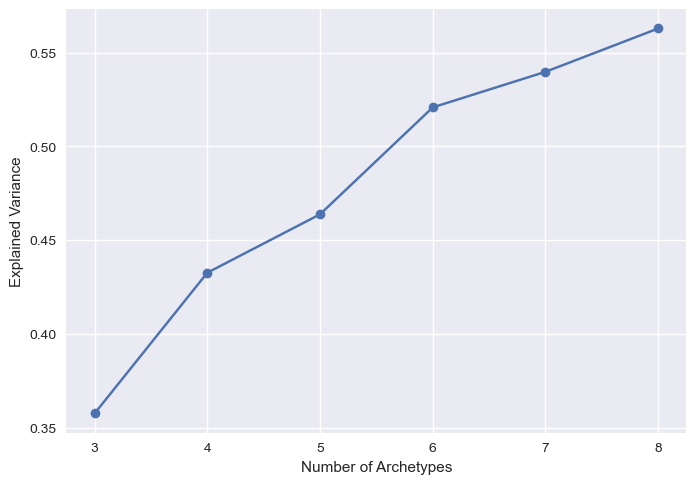

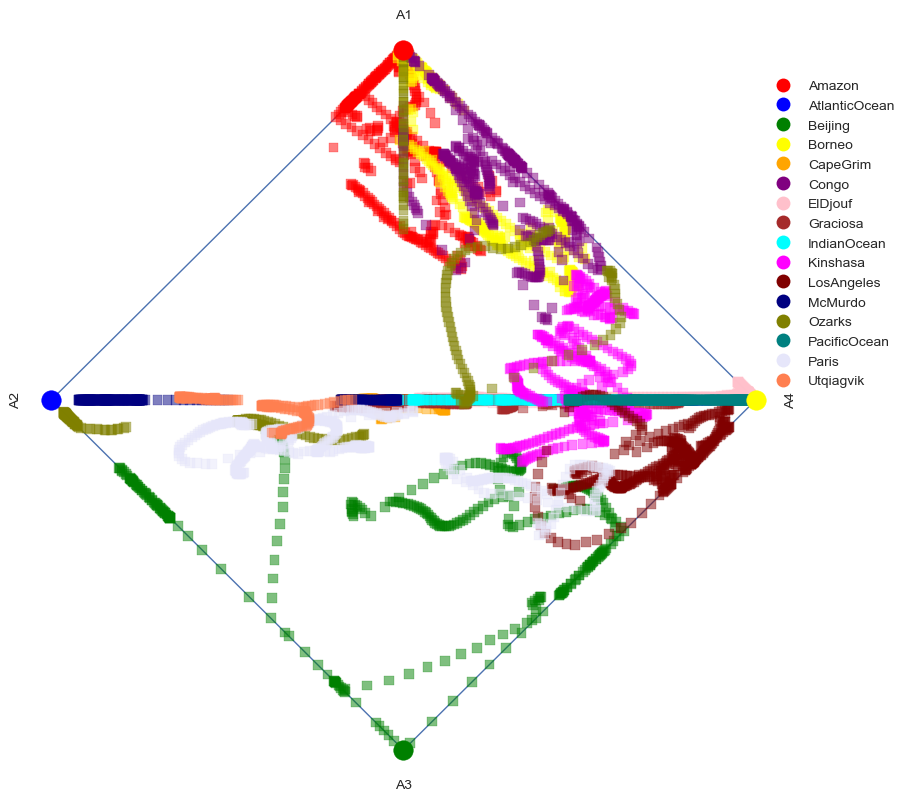

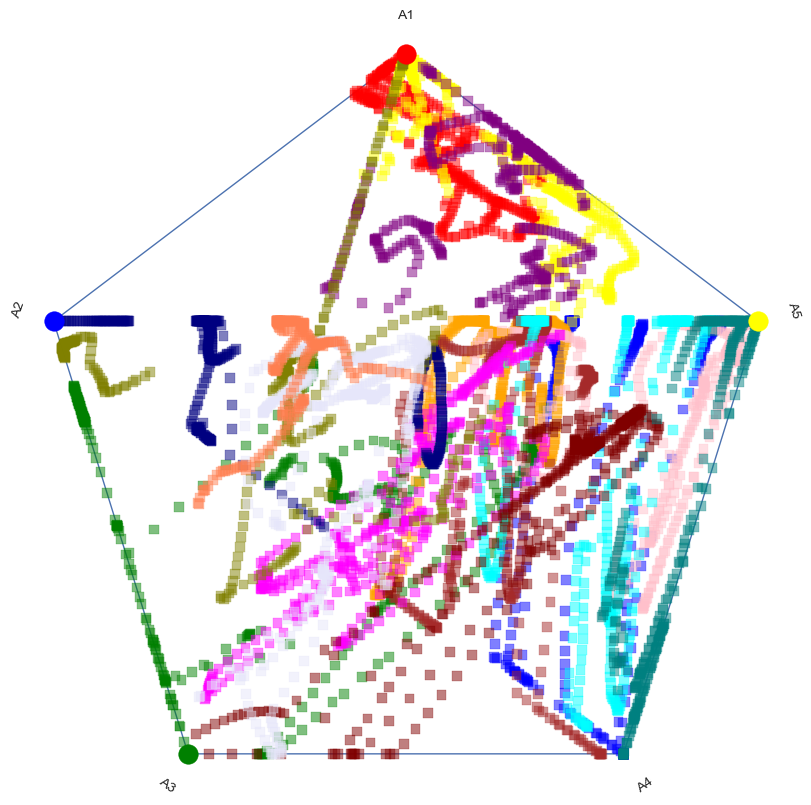

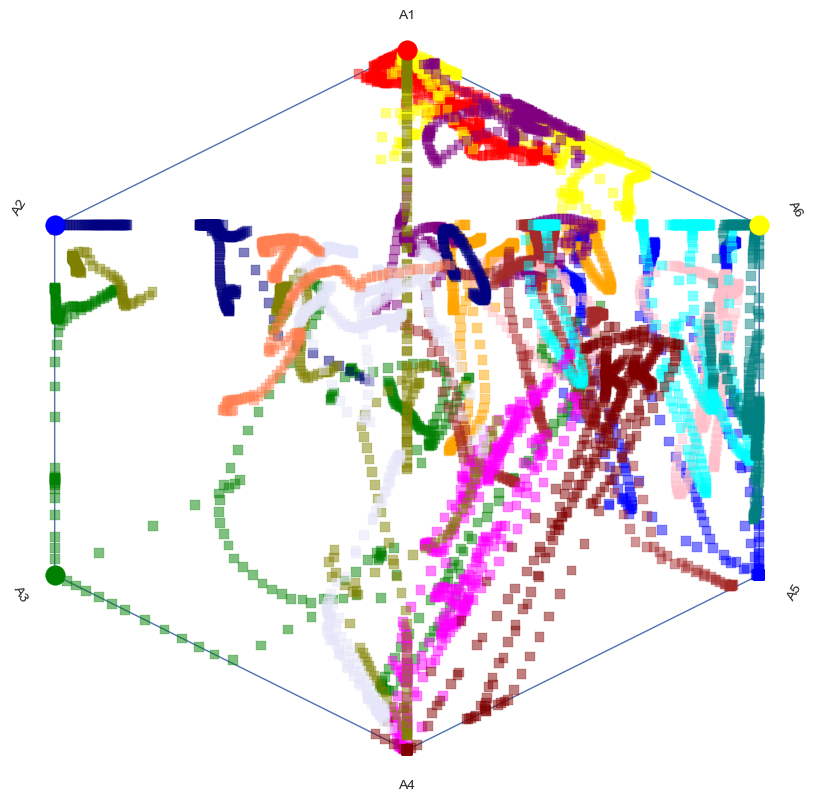

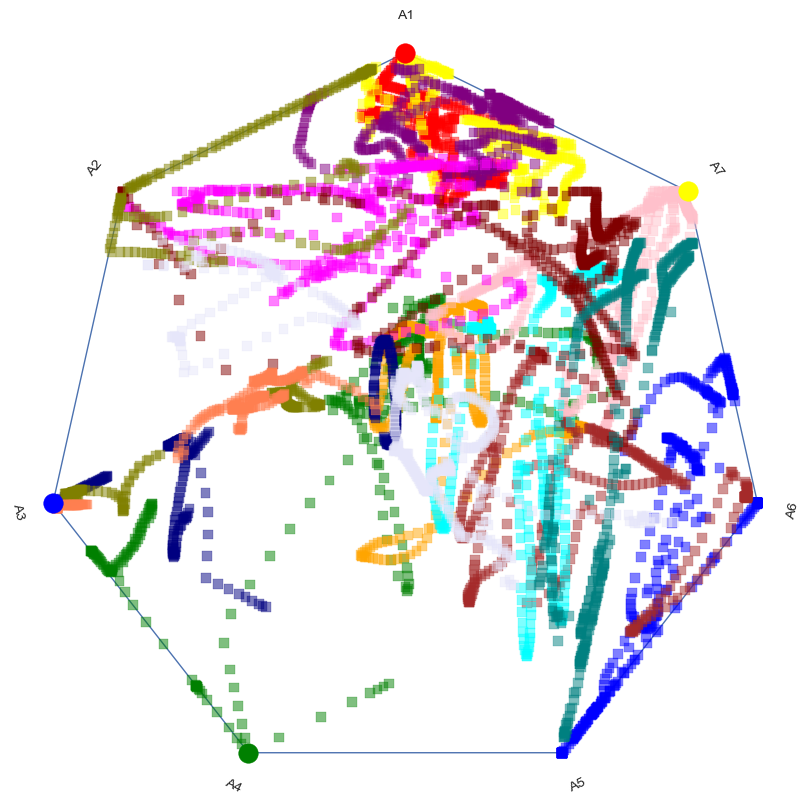

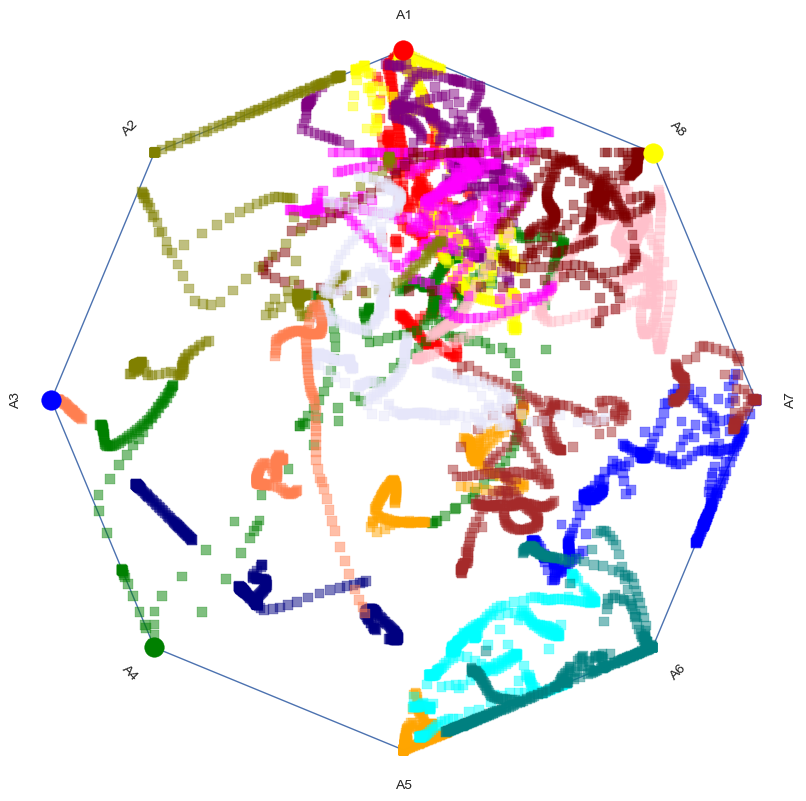

In [8]:
lst_feat = ['C' + str(i) for i in range(1,291+1)]

sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)

AA_list_level1=[]
lst_exp_var_level1 = []
for i in range(3,9):
    AA = ArchetypalAnalysis(n_archetypes = i, 
                            tolerance = 0.001, 
                            max_iter = 200, 
                            random_state = 0, 
                            C = 0.0001, 
                            initialize = 'random',
                            redundancy_try = 30)
    AA.fit(X_scaled)
    AA_list_level1.append(AA)
    lst_exp_var_level1.append(AA.explained_variance_)
    
#explained variance
n_archs = list(range(3, 9))
plt.style.use('seaborn')
plt.plot(n_archs, lst_exp_var_level1, '-o')
plt.xlabel('Number of Archetypes')
plt.ylabel('Explained Variance')
plt.show()

#coloring - Location
colors = ['Red', 'Blue', 'Green', 'Yellow', 'Orange', 'Purple', 'Pink', 'Brown', 'Cyan', 'Magenta', 'Maroon', 'Navy', 'Olive', 'Teal', 'Lavender', 'Coral']
df_args = level1_df[['location']].copy()
df_args['color'] = colors[0]
uniq_locations = df_args['location'].unique()
color_dict = {location: color for location, color in zip(uniq_locations, colors)}
df_args['color'] = df_args['location'].map(color_dict)
plot_args = {'color': df_args['color']}
color_dict = {location: color for location, color in zip(uniq_locations, colors)}

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1[1:]:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = True)
    else:
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = False)

In [ ]:
level1_df

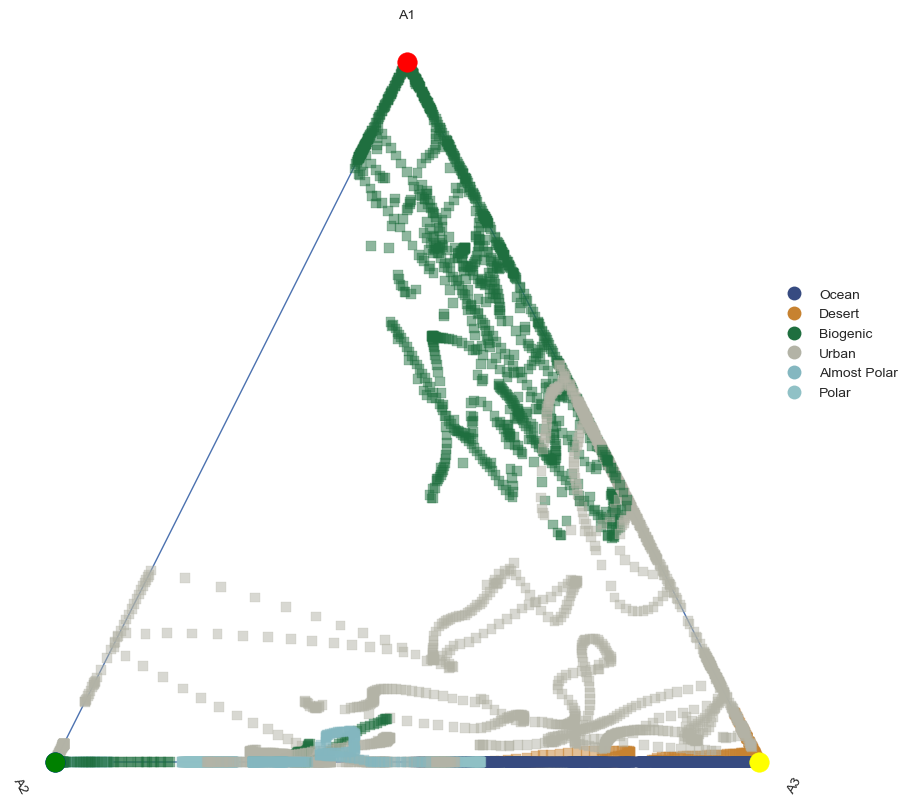

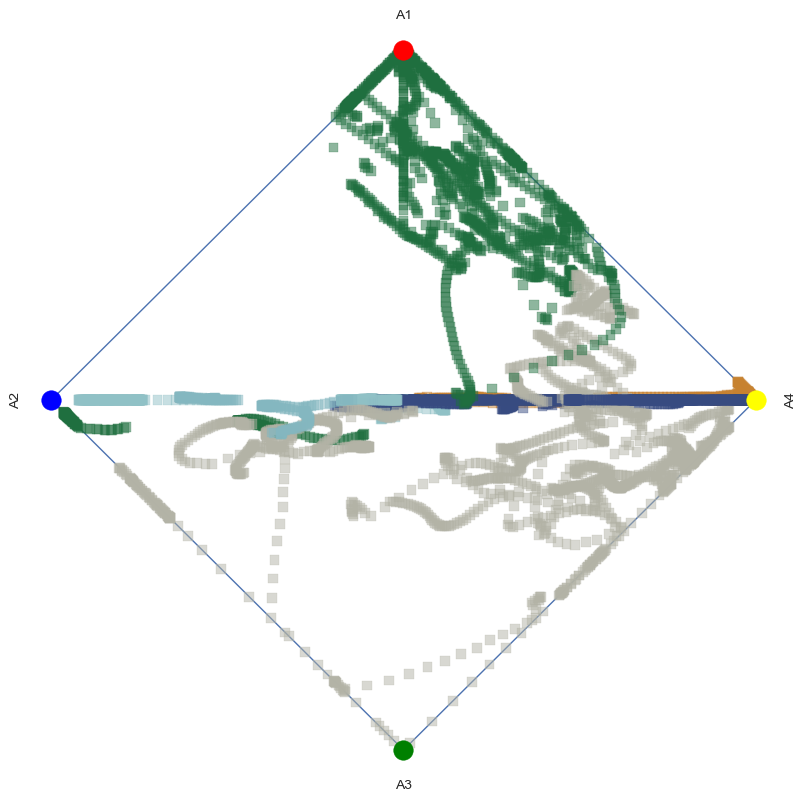

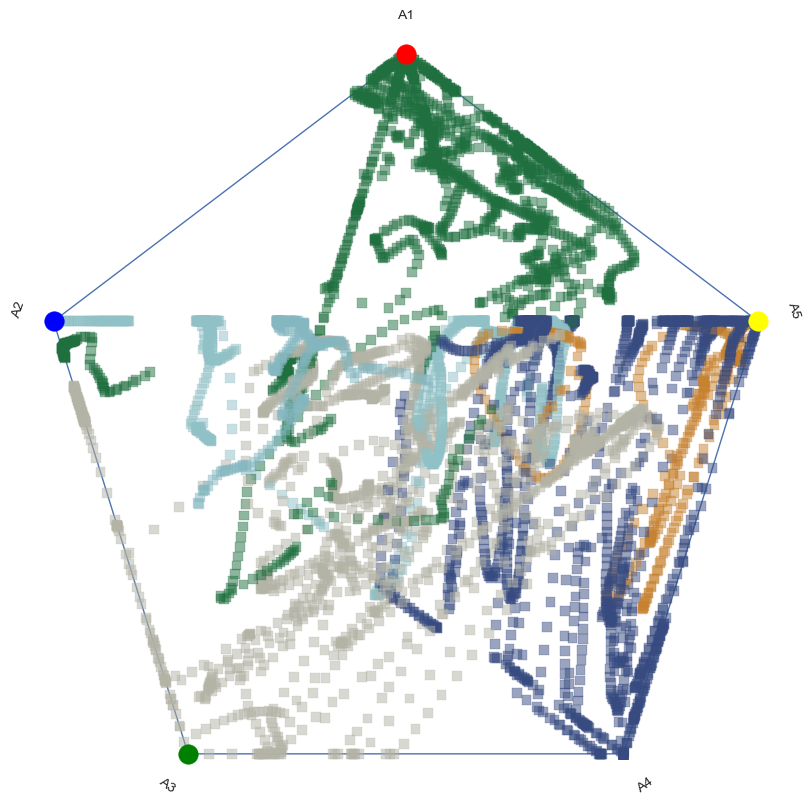

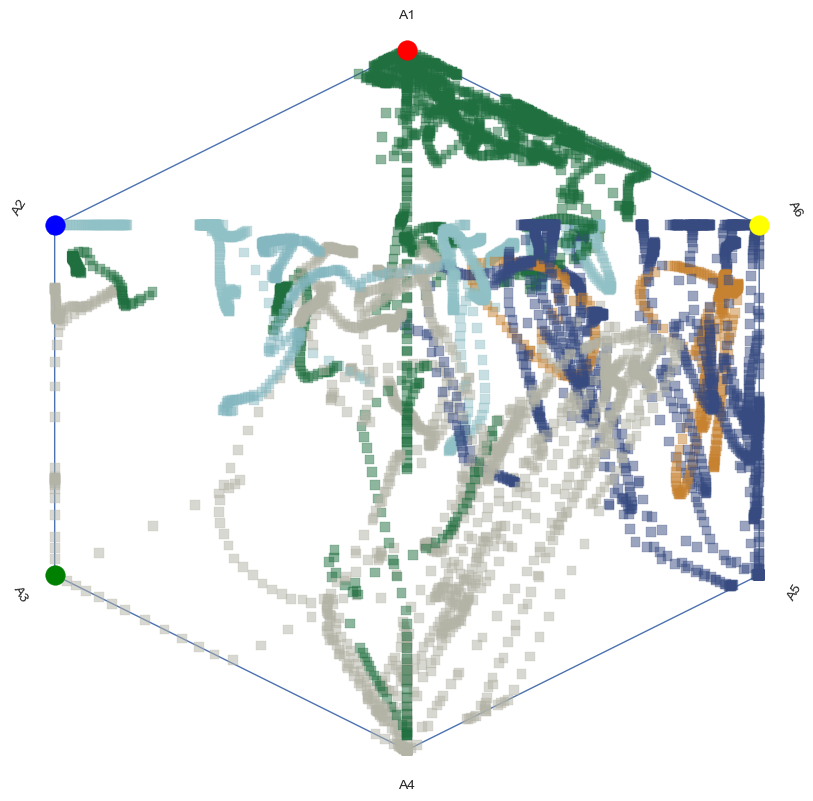

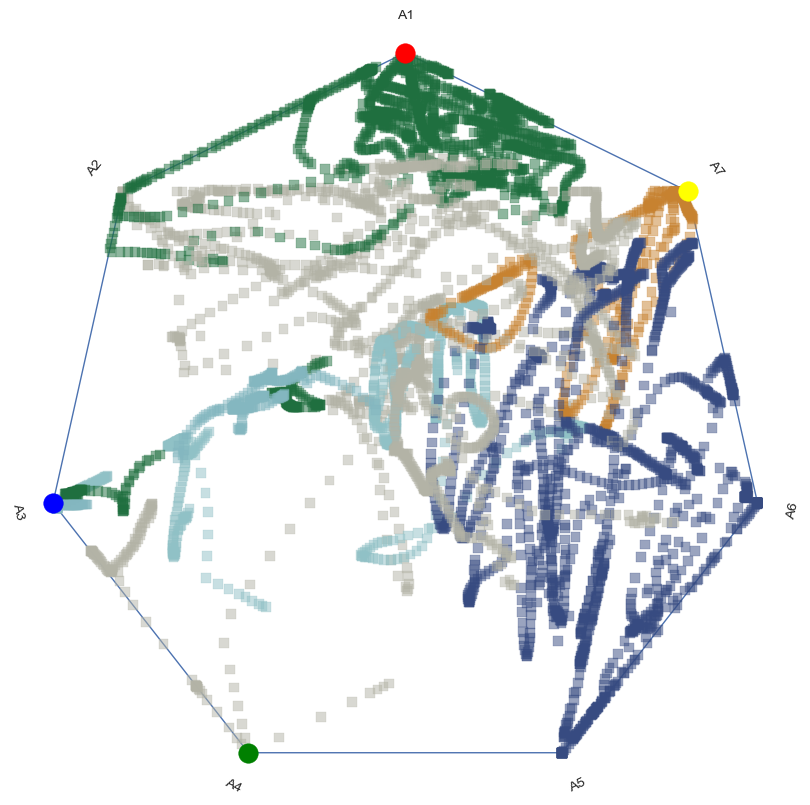

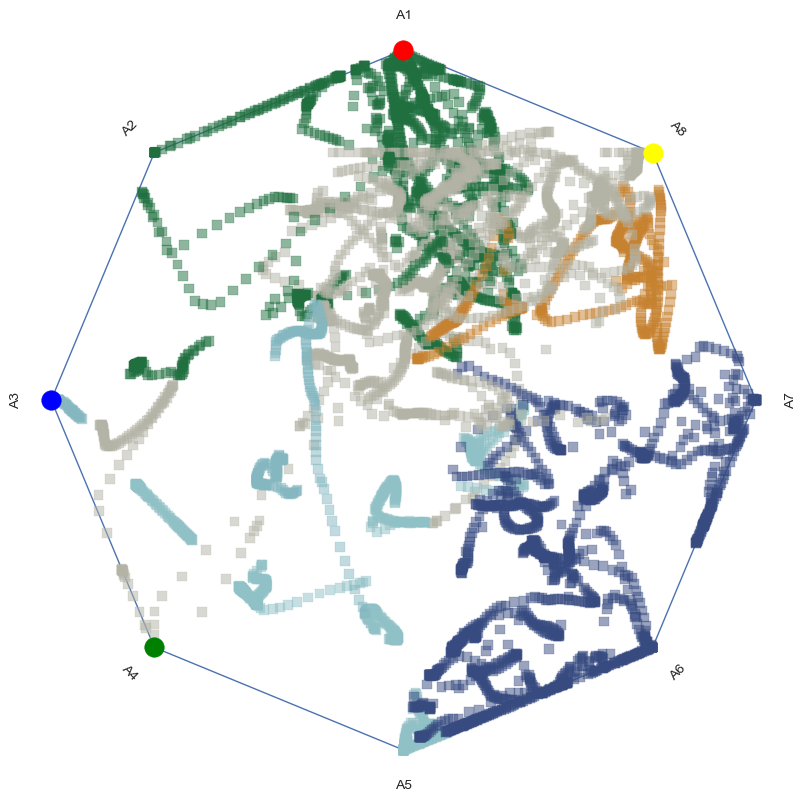

In [195]:
#coloring - Region
df_args = level1_df[['region']].copy()
df_args['color'] = df_args['region'].map(region_color)
plot_args = {'color': df_args['color']}
color_dict = region_color

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = True)
    else:
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = False)

In [ ]:
#coloring - NOX
legend_color = list(level1_df['C270'] + level1_df['C280']) #get concentrations
plot_args = {'color':None}

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1[1:]:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='cividis', categorical=False, legend_color = legend_color, label = True)
    else:
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='cividis', categorical=False, legend_color = legend_color, label = False)

In [ ]:
#coloring - NOX

legend_color = list(level1_df['C270'] + level1_df['C280']) #get concentrations
legend_color = np.log10(np.array(legend_color))
plot_args = {'color':None}

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1[1:]:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='YlOrBr', categorical=False, legend_color = legend_color, label = 'log(NOx)')
    else:
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='YlOrBr', categorical=False, legend_color = legend_color, label = 'log(NOx)')

In [ ]:
#coloring - pc1 - DOUBT
legend_color = pc1_values
plot_args = {'color':None}

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1[1:]:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='cividis', categorical=False, legend_color = legend_color, label = True)
    else:
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='cividis', categorical=False, legend_color = legend_color, label = False)

# Analysis on level - 1, Los Angeles, April reaction rates

In [108]:
L1_rates = df[df['level'] == 1].copy()
L1_LA_rates = L1_rates[L1_rates['location'] == 'LosAngeles'].copy()
L1_LA_rates['timestamp'] = pd.to_datetime(L1_LA_rates['timestamp'], format='%Y/%m/%d %H:%M')
L1_LA_rates['month'] = L1_LA_rates['timestamp'].dt.month
April_L1_LA_rates_df = L1_LA_rates[L1_LA_rates['month'] == 4].copy()
April_L1_LA_rates_df

,location,timestamp,longitude,latitude,level,temperature,pressure,air_number_density,average_water,cloud_fraction,...,K907,K908,K909,K910,K911,K912,K913,twilight,region,month
filename,,,,,,,,,,,,,,,,,,,,,
LosAngelesTwilight_L1_20180402_0130.txt,LosAngeles,2018-04-02 01:30:00,-117.9876,34.4658,1,296.69,911.2661,2.217000e+19,0.006205,0.0,...,3.258781e-06,1.285969e-06,2.374276e-07,9.940564e-07,2.374276e-07,2.374276e-07,9.221887e-07,True,Urban,4
LosAngelesTwilight_L1_20180402_0145.txt,LosAngeles,2018-04-02 01:45:00,-117.9876,34.4658,1,296.20,911.3063,2.221000e+19,0.006339,0.0,...,1.418443e-06,5.507626e-07,1.063010e-07,4.339491e-07,1.063010e-07,1.063010e-07,3.942747e-07,True,Urban,4
LosAngelesTwilight_L1_20180402_0200.txt,LosAngeles,2018-04-02 02:00:00,-117.9876,34.4658,1,295.56,911.3462,2.226000e+19,0.006500,0.0,...,3.622897e-07,1.427217e-07,2.939894e-08,1.103469e-07,2.939894e-08,2.939894e-08,1.020510e-07,True,Urban,4
LosAngelesTwilight_L1_20180402_0215.txt,LosAngeles,2018-04-02 02:15:00,-117.9876,34.4658,1,294.94,911.3923,2.230000e+19,0.006657,0.0,...,3.471889e-08,1.421775e-08,2.757461e-09,1.048857e-08,2.757461e-09,2.757461e-09,1.021158e-08,True,Urban,4
LosAngelesTwilight_L1_20180402_0230.txt,LosAngeles,2018-04-02 02:30:00,-117.9876,34.4658,1,294.31,911.4551,2.235000e+19,0.006815,0.0,...,4.326681e-10,1.629496e-10,3.873753e-11,1.328087e-10,3.873753e-11,3.873753e-11,1.154288e-10,True,Urban,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LosAngeles_L1_20180402_1945.txt,LosAngeles,2018-04-02 19:45:00,-117.9876,34.4658,1,294.76,910.6889,2.231000e+19,0.006184,0.0,...,8.112343e-05,4.397578e-05,5.378578e-06,2.275574e-05,5.378578e-06,5.378578e-06,3.281454e-05,False,Urban,4
LosAngeles_L1_20180402_2000.txt,LosAngeles,2018-04-02 20:00:00,-117.9876,34.4658,1,295.12,910.5688,2.228000e+19,0.006169,0.0,...,8.093773e-05,4.385067e-05,5.366514e-06,2.270782e-05,5.366514e-06,5.366514e-06,3.271786e-05,False,Urban,4
LosAngeles_L1_20180402_2015.txt,LosAngeles,2018-04-02 20:15:00,-117.9876,34.4658,1,295.45,910.4555,2.225000e+19,0.006184,0.0,...,8.044703e-05,4.352068e-05,5.334553e-06,2.258110e-05,5.334553e-06,5.334553e-06,3.246295e-05,False,Urban,4


C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2496484216.py:23: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


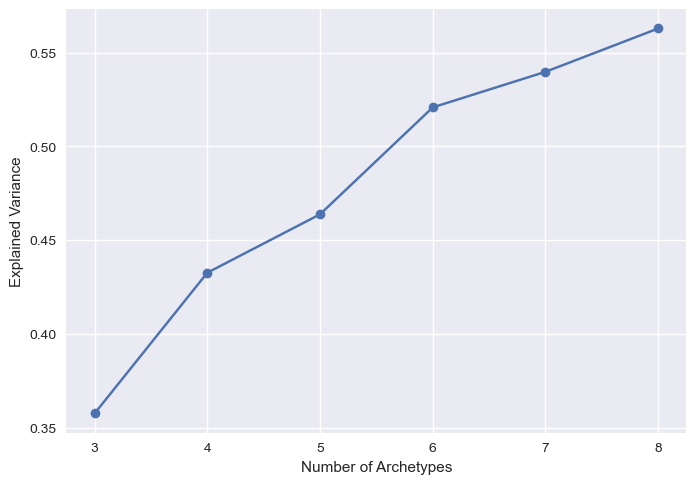

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2512541564.py:101: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap)


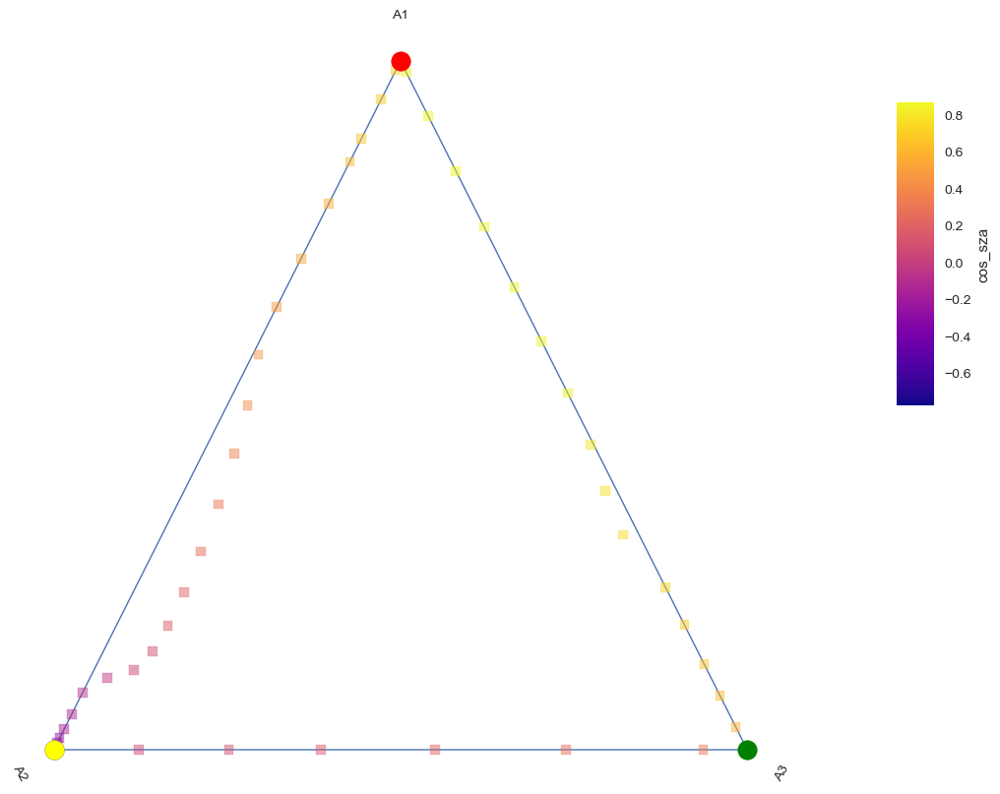

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2512541564.py:101: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap)


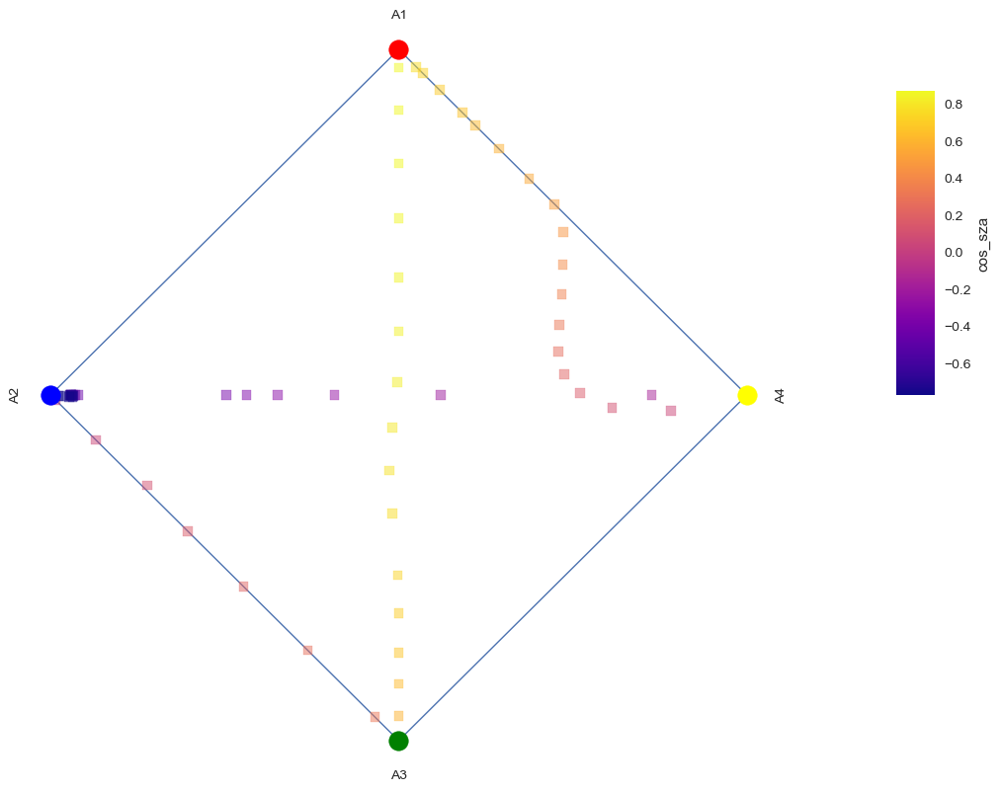

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2512541564.py:101: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap)


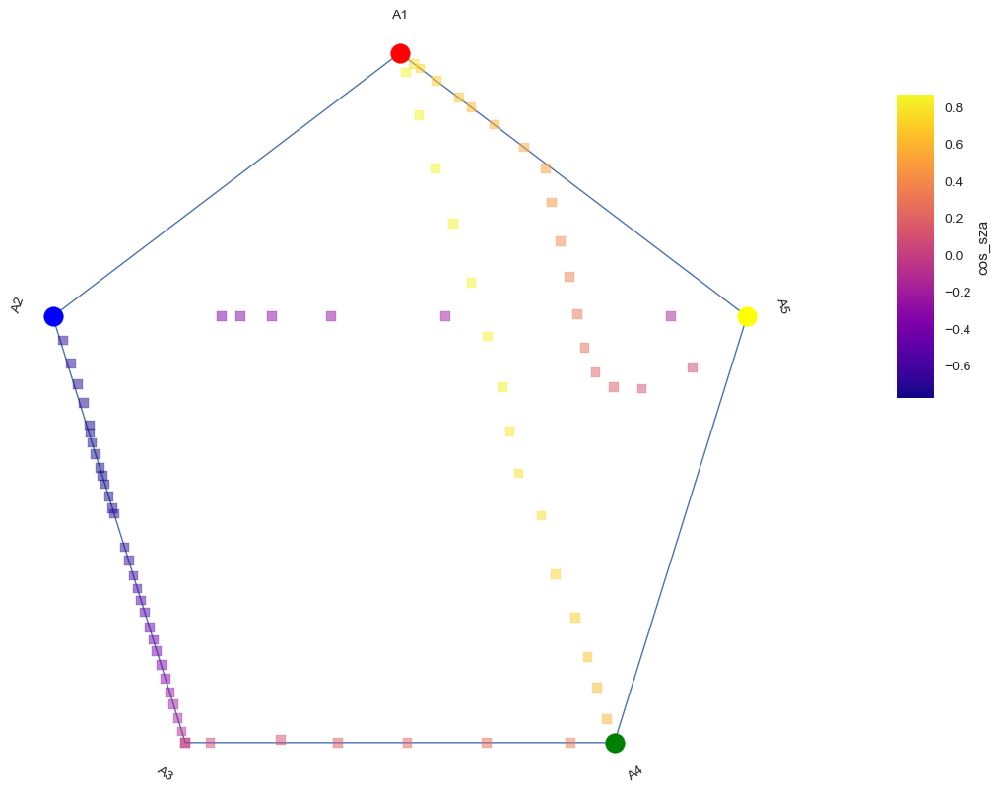

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2512541564.py:101: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap)


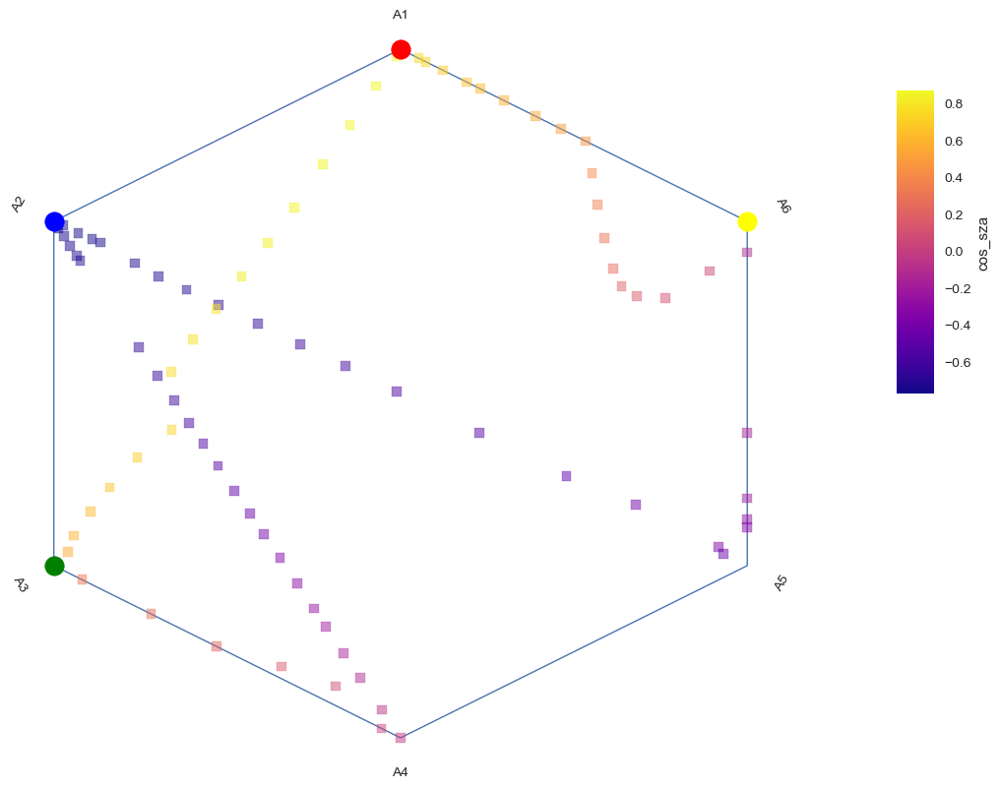

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2512541564.py:101: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap)


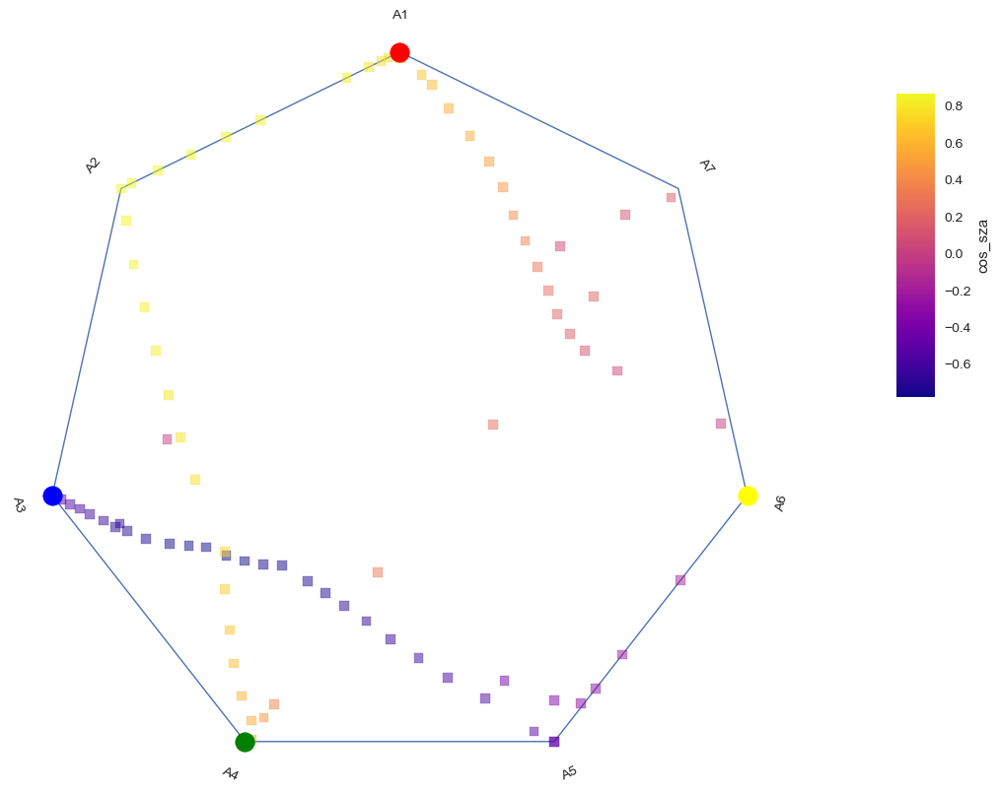

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\2512541564.py:101: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap)


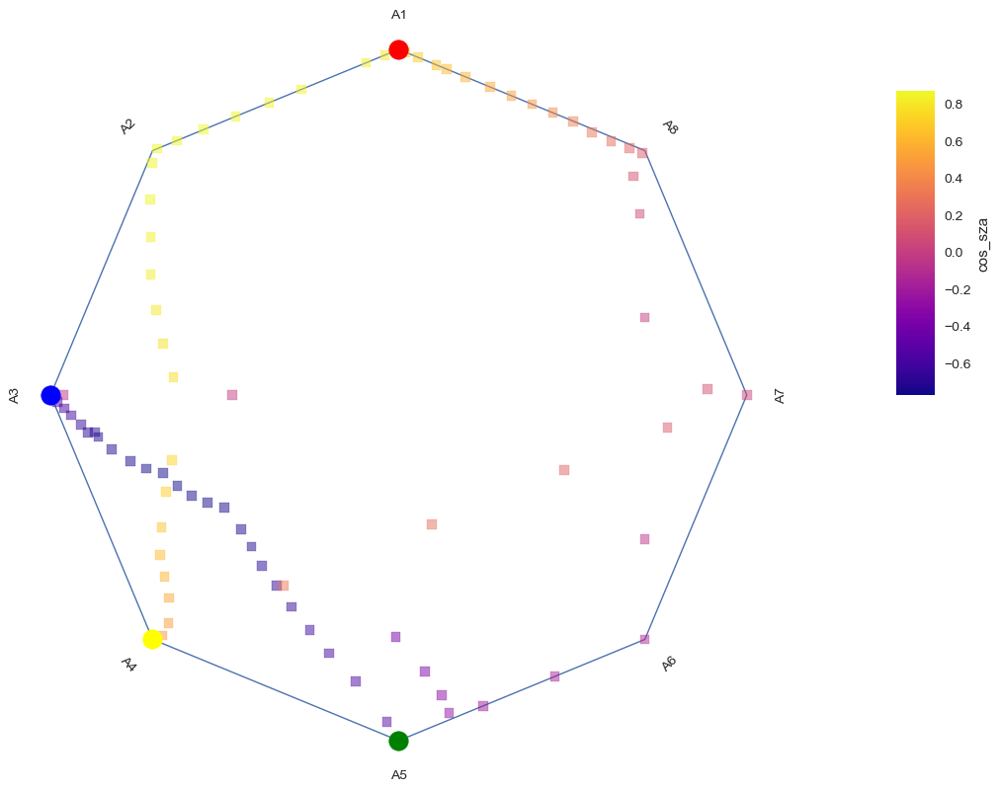

In [199]:
lst_feat = ['R' + str(i) for i in range(1,913+1)]

sc = StandardScaler()
X = April_L1_LA_rates_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)

AA_list_la_l1_april=[]
lst_exp_var_la_l1_april = []
for i in range(3,9):
    AA = ArchetypalAnalysis(n_archetypes = i, 
                            tolerance = 0.001, 
                            max_iter = 200, 
                            random_state = 0, 
                            C = 0.0001, 
                            initialize = 'random',
                            redundancy_try = 30)
    AA.fit(X_scaled)
    AA_list_la_l1_april.append(AA)
    lst_exp_var_la_l1_april.append(AA.explained_variance_)
    
#explained variance
n_archs = list(range(3, 9))
plt.style.use('seaborn')
plt.plot(n_archs, lst_exp_var_level1, '-o')
plt.xlabel('Number of Archetypes')
plt.ylabel('Explained Variance')
plt.show()


#coloring - cosine zenith
legend_color = list(April_L1_LA_rates_df['cos_sza']) #get concentrations
plot_args = {'color':None}

#simplex plots    
flag = True
arr1 = AA_list_la_l1_april[1].archetypes.T
color_indices = []
for AA in AA_list_la_l1_april:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='plasma', categorical=False, legend_color = legend_color, label = 'cos_sza')
    else:
        plot_simplex(AA.n_archetypes, AA.alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, cmap='plasma', categorical=False, legend_color = legend_color, label = 'cos_sza')

In [ ]:
level1_df[['R' + str(i) for i in range(1,913+1)]].describe()

# Radar Plots - Exploring

### Level - 1 concentrations

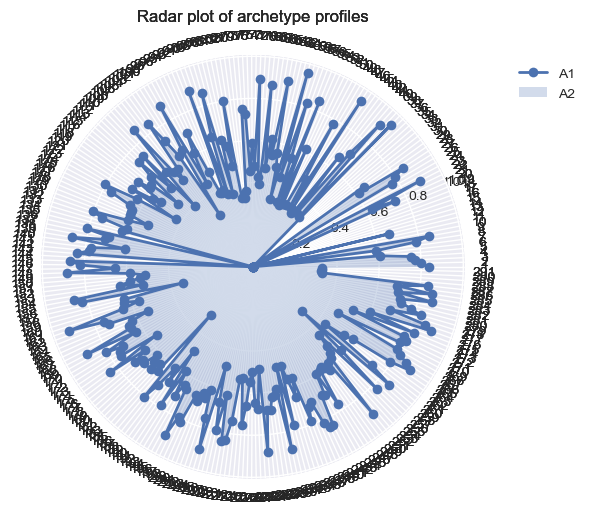

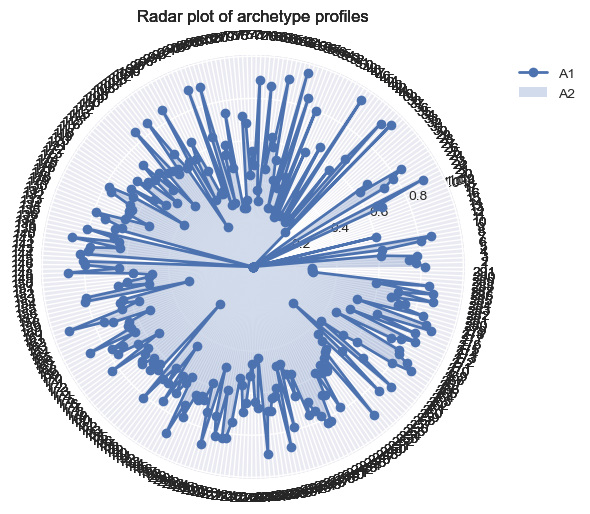

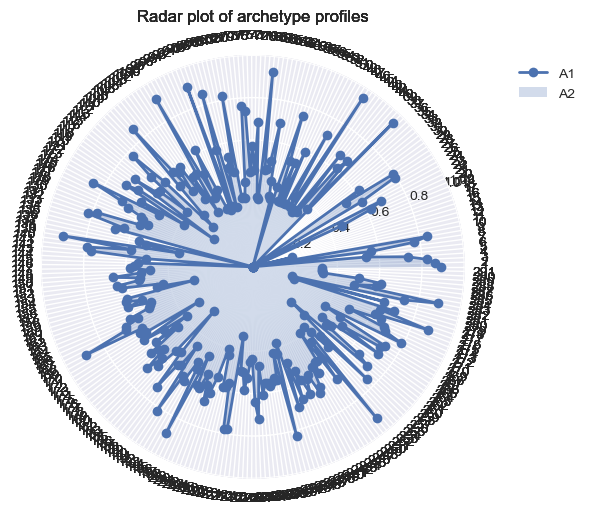

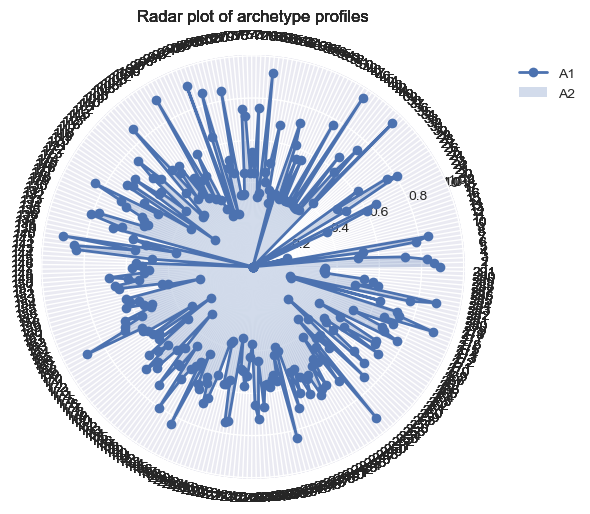

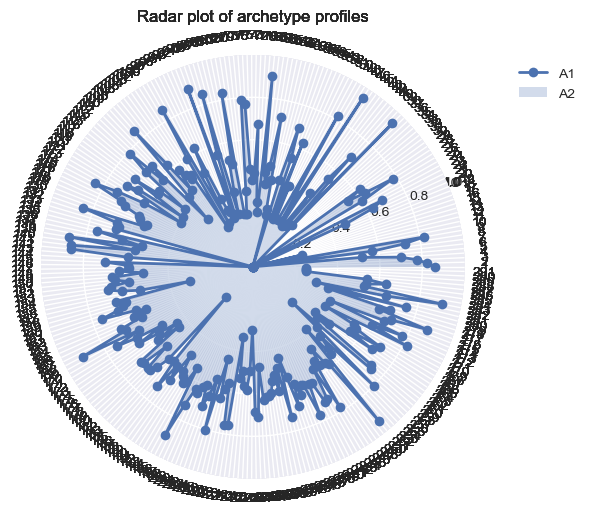

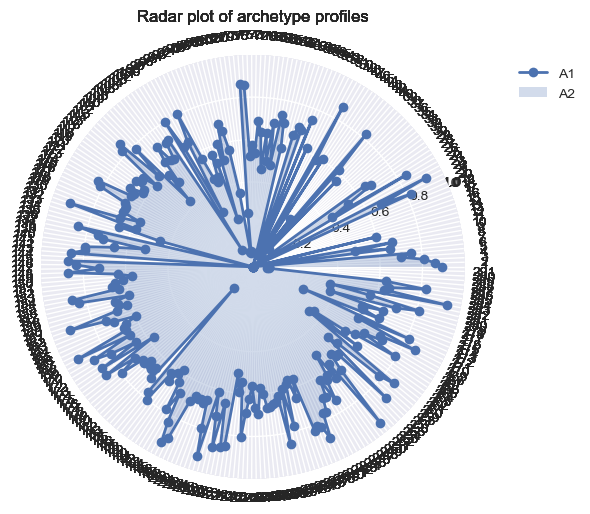

In [9]:
for AA in AA_list_level1:
    AA.plot_radar_profile(feature_cols = None, Title = 'Radar plot of archetype profiles')

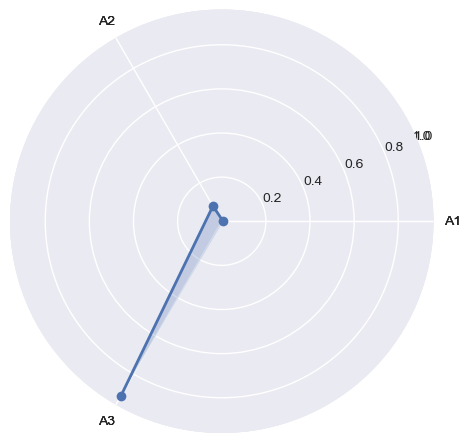

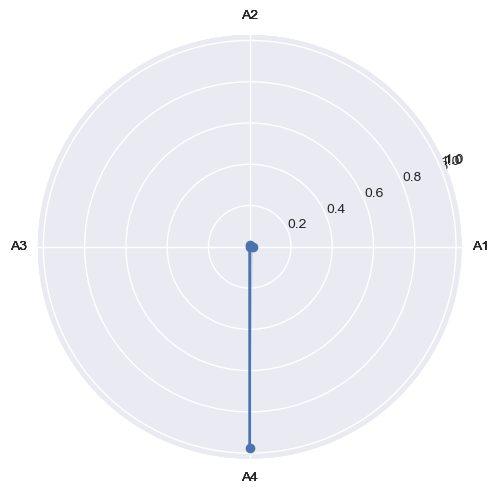

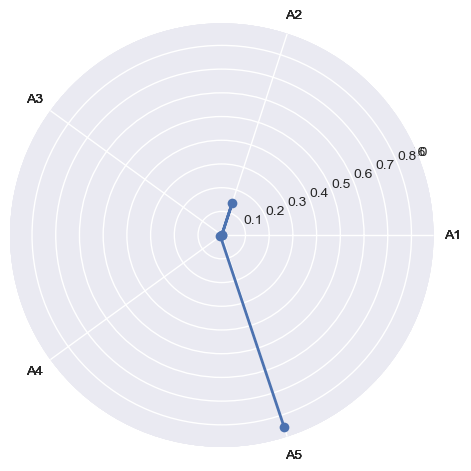

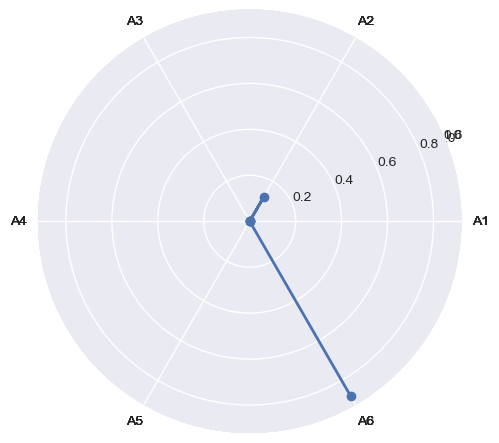

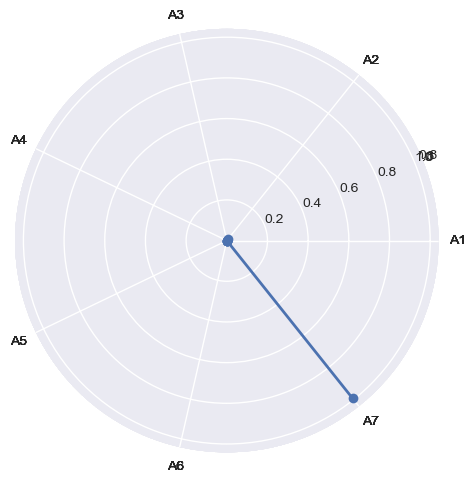

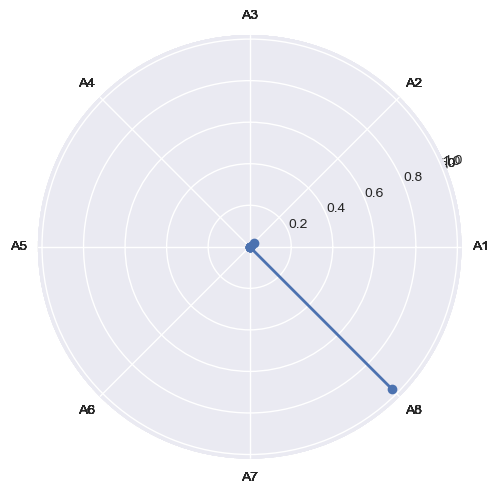

In [16]:
for AA in AA_list_level1:
#     AA.plot_radar_profile(feature_cols = None, Title = 'Radar plot of archetype profiles')
    AA._extract_closes_match()
    AA.close_match
    AA.plot_close_match(Title='')

In [14]:
# idx = 25
# plot_radar_datapoint(AA_list_level1[1], X_scaled[idx,:], Title=f'Radar plot of datapoint index = {idx}')

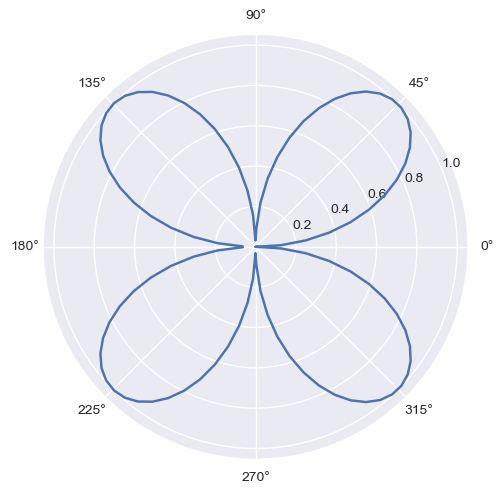

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Generate sample data
theta = np.linspace(0, 2*np.pi, 100)
r = np.abs(np.sin(2*theta))

# Create polar plot
plt.figure()
ax = plt.subplot(111, projection='polar')
ax.plot(theta, r)

# Show plot
plt.show()


<PolarAxes: title={'center': 'Radar plot of datapoint index = 45'}>

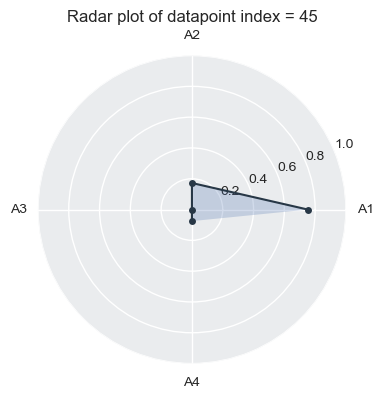

In [67]:
idx = 45
plot_radar_datapoint(AA, X_scaled[idx,:].reshape(1,-1), Title=f'Radar plot of datapoint index = {idx}')

In [68]:
X_scaled[idx,:].reshape(1,-1).shape

(1, 291)

In [ ]:
def plot_radar_datapoints(AA, X, Title = 'Radar plot of datapoint'):

    _, alfa_X = AA.transform(X)
    
    labels = ['A' + str(i+1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint = False)
    
    fig=plt.figure(figsize=(4,4))          
    
    ax = fig.add_subplot(111, polar=True)
    ax = plt.subplot(111, polar=True)
    ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color='#273746')
    ax.fill(angles, alfa_X, alpha=0.25)
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0,1)
    ax.set_facecolor('#EAECEE')
    
    return ax


idx = 45
plot_radar_datapoints(AA, X_scaled[idx,:].reshape(1,-1), Title=f'Radar plot of datapoint index = {idx}')

In [ ]:
# get mean data point for each category - column
# plot the plot_radar_datapoint

def plot_category_mean_radar(AA, df, column):
    

In [44]:
import numpy as np
import matplotlib.pyplot as plt

def plot_category_mean_radar(AA, df, column, Title='Radar plot of mean data points'):
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    
    # Initialize an empty list to store data points
    data_points = []
    
    # Calculate mean data point for each category
    for category in categories:
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        
        # Calculate mean of the subset
        mean_data_point = subset.mean(axis=0).values.reshape(1, -1)
        
        # Append to the list of data points
        data_points.append(mean_data_point)
        print(mean_data_point.shape)
    
    # Call plot_radar_datapoint function with data points
    _, alfa_X = AA.transform(np.concatenate(data_points, axis=0))
    labels = ['A' + str(i + 1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint=False)
    
    fig = plt.figure(figsize=(4, 4))
    ax = fig.add_subplot(111, polar=True)
    ax = plt.subplot(111, polar=True)
    
    for data_point in alfa_X:
        ax.plot(angles, data_point, 'o-', markersize=5, linewidth=1.5, color='#273746')
        ax.fill(angles, data_point, alpha=0.25)
    
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0, 1)
    ax.set_facecolor('#EAECEE')
    
    return ax

In [45]:
# Example usage:
plot_category_mean_radar(AA, level1_df, 'region', Title='Radar plot of mean data points - Region')

TypeError: Could not convert ['AmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonAmazonBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoBorneoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoCongoOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarksOzarks'
 '2018/01/01 21:452018/01/01 22:002018/01/01 22:152018/01/01 22:302018/01/02 09:302018/01/02 09:452018/01/02 10:002018/01/02 10:152018/01/02 10:302018/04/01 21:302018/04/01 21:452018/04/01 22:002018/04/01 22:152018/04/01 22:302018/04/02 09:452018/04/02 10:002018/04/02 10:152018/04/02 10:302018/07/01 21:302018/07/01 21:452018/07/01 22:002018/07/01 22:152018/07/01 22:302018/07/02 09:452018/07/02 10:002018/07/02 10:152018/07/02 10:302018/09/30 21:452018/09/30 22:002018/09/30 22:152018/09/30 22:302018/10/01 09:302018/10/01 09:452018/10/01 10:002018/10/01 10:152018/10/01 10:302018/01/01 21:002018/01/01 21:152018/01/01 21:302018/01/01 22:452018/01/01 23:002018/01/01 23:152018/01/01 23:302018/01/01 23:452018/01/02 00:002018/01/02 00:152018/01/02 00:302018/01/02 00:452018/01/02 01:002018/01/02 01:152018/01/02 01:302018/01/02 01:452018/01/02 02:002018/01/02 02:152018/01/02 02:302018/01/02 02:452018/01/02 03:002018/01/02 03:152018/01/02 03:302018/01/02 03:452018/01/02 04:002018/01/02 04:152018/01/02 04:302018/01/02 04:452018/01/02 05:002018/01/02 05:152018/01/02 05:302018/01/02 05:452018/01/02 06:002018/01/02 06:152018/01/02 06:302018/01/02 06:452018/01/02 07:002018/01/02 07:152018/01/02 07:302018/01/02 07:452018/01/02 08:002018/01/02 08:152018/01/02 08:302018/01/02 08:452018/01/02 09:002018/01/02 09:152018/01/02 10:452018/01/02 11:002018/01/02 11:152018/01/02 11:302018/01/02 11:452018/01/02 12:002018/01/02 12:152018/01/02 12:302018/01/02 12:452018/01/02 13:002018/01/02 13:152018/01/02 13:302018/01/02 13:452018/01/02 14:002018/01/02 14:152018/01/02 14:302018/01/02 14:452018/01/02 15:002018/01/02 15:152018/01/02 15:302018/01/02 15:452018/01/02 16:002018/01/02 16:152018/01/02 16:302018/01/02 16:452018/01/02 17:002018/01/02 17:152018/01/02 17:302018/01/02 17:452018/01/02 18:002018/01/02 18:152018/01/02 18:302018/01/02 18:452018/01/02 19:002018/01/02 19:152018/01/02 19:302018/01/02 19:452018/01/02 20:002018/01/02 20:152018/01/02 20:302018/01/02 20:452018/04/01 21:002018/04/01 21:152018/04/01 22:452018/04/01 23:002018/04/01 23:152018/04/01 23:302018/04/01 23:452018/04/02 00:002018/04/02 00:152018/04/02 00:302018/04/02 00:452018/04/02 01:002018/04/02 01:152018/04/02 01:302018/04/02 01:452018/04/02 02:002018/04/02 02:152018/04/02 02:302018/04/02 02:452018/04/02 03:002018/04/02 03:152018/04/02 03:302018/04/02 03:452018/04/02 04:002018/04/02 04:152018/04/02 04:302018/04/02 04:452018/04/02 05:002018/04/02 05:152018/04/02 05:302018/04/02 05:452018/04/02 06:002018/04/02 06:152018/04/02 06:302018/04/02 06:452018/04/02 07:002018/04/02 07:152018/04/02 07:302018/04/02 07:452018/04/02 08:002018/04/02 08:152018/04/02 08:302018/04/02 08:452018/04/02 09:002018/04/02 09:152018/04/02 09:302018/04/02 10:452018/04/02 11:002018/04/02 11:152018/04/02 11:302018/04/02 11:452018/04/02 12:002018/04/02 12:152018/04/02 12:302018/04/02 12:452018/04/02 13:002018/04/02 13:152018/04/02 13:302018/04/02 13:452018/04/02 14:002018/04/02 14:152018/04/02 14:302018/04/02 14:452018/04/02 15:002018/04/02 15:152018/04/02 15:302018/04/02 15:452018/04/02 16:002018/04/02 16:152018/04/02 16:302018/04/02 16:452018/04/02 17:002018/04/02 17:152018/04/02 17:302018/04/02 17:452018/04/02 18:002018/04/02 18:152018/04/02 18:302018/04/02 18:452018/04/02 19:002018/04/02 19:152018/04/02 19:302018/04/02 19:452018/04/02 20:002018/04/02 20:152018/04/02 20:302018/04/02 20:452018/07/01 21:002018/07/01 21:152018/07/01 22:452018/07/01 23:002018/07/01 23:152018/07/01 23:302018/07/01 23:452018/07/02 00:002018/07/02 00:152018/07/02 00:302018/07/02 00:452018/07/02 01:002018/07/02 01:152018/07/02 01:302018/07/02 01:452018/07/02 02:002018/07/02 02:152018/07/02 02:302018/07/02 02:452018/07/02 03:002018/07/02 03:152018/07/02 03:302018/07/02 03:452018/07/02 04:002018/07/02 04:152018/07/02 04:302018/07/02 04:452018/07/02 05:002018/07/02 05:152018/07/02 05:302018/07/02 05:452018/07/02 06:002018/07/02 06:152018/07/02 06:302018/07/02 06:452018/07/02 07:002018/07/02 07:152018/07/02 07:302018/07/02 07:452018/07/02 08:002018/07/02 08:152018/07/02 08:302018/07/02 08:452018/07/02 09:002018/07/02 09:152018/07/02 09:302018/07/02 10:452018/07/02 11:002018/07/02 11:152018/07/02 11:302018/07/02 11:452018/07/02 12:002018/07/02 12:152018/07/02 12:302018/07/02 12:452018/07/02 13:002018/07/02 13:152018/07/02 13:302018/07/02 13:452018/07/02 14:002018/07/02 14:152018/07/02 14:302018/07/02 14:452018/07/02 15:002018/07/02 15:152018/07/02 15:302018/07/02 15:452018/07/02 16:002018/07/02 16:152018/07/02 16:302018/07/02 16:452018/07/02 17:002018/07/02 17:152018/07/02 17:302018/07/02 17:452018/07/02 18:002018/07/02 18:152018/07/02 18:302018/07/02 18:452018/07/02 19:002018/07/02 19:152018/07/02 19:302018/07/02 19:452018/07/02 20:002018/07/02 20:152018/07/02 20:302018/07/02 20:452018/09/30 21:002018/09/30 21:152018/09/30 21:302018/09/30 22:452018/09/30 23:002018/09/30 23:152018/09/30 23:302018/09/30 23:452018/10/01 00:002018/10/01 00:152018/10/01 00:302018/10/01 00:452018/10/01 01:002018/10/01 01:152018/10/01 01:302018/10/01 01:452018/10/01 02:002018/10/01 02:152018/10/01 02:302018/10/01 02:452018/10/01 03:002018/10/01 03:152018/10/01 03:302018/10/01 03:452018/10/01 04:002018/10/01 04:152018/10/01 04:302018/10/01 04:452018/10/01 05:002018/10/01 05:152018/10/01 05:302018/10/01 05:452018/10/01 06:002018/10/01 06:152018/10/01 06:302018/10/01 06:452018/10/01 07:002018/10/01 07:152018/10/01 07:302018/10/01 07:452018/10/01 08:002018/10/01 08:152018/10/01 08:302018/10/01 08:452018/10/01 09:002018/10/01 09:152018/10/01 10:452018/10/01 11:002018/10/01 11:152018/10/01 11:302018/10/01 11:452018/10/01 12:002018/10/01 12:152018/10/01 12:302018/10/01 12:452018/10/01 13:002018/10/01 13:152018/10/01 13:302018/10/01 13:452018/10/01 14:002018/10/01 14:152018/10/01 14:302018/10/01 14:452018/10/01 15:002018/10/01 15:152018/10/01 15:302018/10/01 15:452018/10/01 16:002018/10/01 16:152018/10/01 16:302018/10/01 16:452018/10/01 17:002018/10/01 17:152018/10/01 17:302018/10/01 17:452018/10/01 18:002018/10/01 18:152018/10/01 18:302018/10/01 18:452018/10/01 19:002018/10/01 19:152018/10/01 19:302018/10/01 19:452018/10/01 20:002018/10/01 20:152018/10/01 20:302018/10/01 20:452018/01/01 21:452018/01/01 22:002018/01/01 22:152018/01/01 22:302018/01/01 22:452018/01/02 10:002018/01/02 10:152018/01/02 10:302018/01/02 10:452018/04/01 22:002018/04/01 22:152018/04/01 22:302018/04/01 22:452018/04/02 10:002018/04/02 10:152018/04/02 10:302018/04/02 10:452018/07/01 22:002018/07/01 22:152018/07/01 22:302018/07/01 22:452018/07/02 09:452018/07/02 10:002018/07/02 10:152018/07/02 10:302018/07/02 10:452018/09/30 22:002018/09/30 22:152018/09/30 22:302018/09/30 22:452018/10/01 10:002018/10/01 10:152018/10/01 10:302018/10/01 10:452018/01/01 21:002018/01/01 21:152018/01/01 21:302018/01/01 23:002018/01/01 23:152018/01/01 23:302018/01/01 23:452018/01/02 00:002018/01/02 00:152018/01/02 00:302018/01/02 00:452018/01/02 01:002018/01/02 01:152018/01/02 01:302018/01/02 01:452018/01/02 02:002018/01/02 02:152018/01/02 02:302018/01/02 02:452018/01/02 03:002018/01/02 03:152018/01/02 03:302018/01/02 03:452018/01/02 04:002018/01/02 04:152018/01/02 04:302018/01/02 04:452018/01/02 05:002018/01/02 05:152018/01/02 05:302018/01/02 05:452018/01/02 06:002018/01/02 06:152018/01/02 06:302018/01/02 06:452018/01/02 07:002018/01/02 07:152018/01/02 07:302018/01/02 07:452018/01/02 08:002018/01/02 08:152018/01/02 08:302018/01/02 08:452018/01/02 09:002018/01/02 09:152018/01/02 09:302018/01/02 09:452018/01/02 11:002018/01/02 11:152018/01/02 11:302018/01/02 11:452018/01/02 12:002018/01/02 12:152018/01/02 12:302018/01/02 12:452018/01/02 13:002018/01/02 13:152018/01/02 13:302018/01/02 13:452018/01/02 14:002018/01/02 14:152018/01/02 14:302018/01/02 14:452018/01/02 15:002018/01/02 15:152018/01/02 15:302018/01/02 15:452018/01/02 16:002018/01/02 16:152018/01/02 16:302018/01/02 16:452018/01/02 17:002018/01/02 17:152018/01/02 17:302018/01/02 17:452018/01/02 18:002018/01/02 18:152018/01/02 18:302018/01/02 18:452018/01/02 19:002018/01/02 19:152018/01/02 19:302018/01/02 19:452018/01/02 20:002018/01/02 20:152018/01/02 20:302018/01/02 20:452018/04/01 21:002018/04/01 21:152018/04/01 21:302018/04/01 21:452018/04/01 23:002018/04/01 23:152018/04/01 23:302018/04/01 23:452018/04/02 00:002018/04/02 00:152018/04/02 00:302018/04/02 00:452018/04/02 01:002018/04/02 01:152018/04/02 01:302018/04/02 01:452018/04/02 02:002018/04/02 02:152018/04/02 02:302018/04/02 02:452018/04/02 03:002018/04/02 03:152018/04/02 03:302018/04/02 03:452018/04/02 04:002018/04/02 04:152018/04/02 04:302018/04/02 04:452018/04/02 05:002018/04/02 05:152018/04/02 05:302018/04/02 05:452018/04/02 06:002018/04/02 06:152018/04/02 06:302018/04/02 06:452018/04/02 07:002018/04/02 07:152018/04/02 07:302018/04/02 07:452018/04/02 08:002018/04/02 08:152018/04/02 08:302018/04/02 08:452018/04/02 09:002018/04/02 09:152018/04/02 09:302018/04/02 09:452018/04/02 11:002018/04/02 11:152018/04/02 11:302018/04/02 11:452018/04/02 12:002018/04/02 12:152018/04/02 12:302018/04/02 12:452018/04/02 13:002018/04/02 13:152018/04/02 13:302018/04/02 13:452018/04/02 14:002018/04/02 14:152018/04/02 14:302018/04/02 14:452018/04/02 15:002018/04/02 15:152018/04/02 15:302018/04/02 15:452018/04/02 16:002018/04/02 16:152018/04/02 16:302018/04/02 16:452018/04/02 17:002018/04/02 17:152018/04/02 17:302018/04/02 17:452018/04/02 18:002018/04/02 18:152018/04/02 18:302018/04/02 18:452018/04/02 19:002018/04/02 19:152018/04/02 19:302018/04/02 19:452018/04/02 20:002018/04/02 20:152018/04/02 20:302018/04/02 20:452018/07/01 21:002018/07/01 21:152018/07/01 21:302018/07/01 21:452018/07/01 23:002018/07/01 23:152018/07/01 23:302018/07/01 23:452018/07/02 00:002018/07/02 00:152018/07/02 00:302018/07/02 00:452018/07/02 01:002018/07/02 01:152018/07/02 01:302018/07/02 01:452018/07/02 02:002018/07/02 02:152018/07/02 02:302018/07/02 02:452018/07/02 03:002018/07/02 03:152018/07/02 03:302018/07/02 03:452018/07/02 04:002018/07/02 04:152018/07/02 04:302018/07/02 04:452018/07/02 05:002018/07/02 05:152018/07/02 05:302018/07/02 05:452018/07/02 06:002018/07/02 06:152018/07/02 06:302018/07/02 06:452018/07/02 07:002018/07/02 07:152018/07/02 07:302018/07/02 07:452018/07/02 08:002018/07/02 08:152018/07/02 08:302018/07/02 08:452018/07/02 09:002018/07/02 09:152018/07/02 09:302018/07/02 11:002018/07/02 11:152018/07/02 11:302018/07/02 11:452018/07/02 12:002018/07/02 12:152018/07/02 12:302018/07/02 12:452018/07/02 13:002018/07/02 13:152018/07/02 13:302018/07/02 13:452018/07/02 14:002018/07/02 14:152018/07/02 14:302018/07/02 14:452018/07/02 15:002018/07/02 15:152018/07/02 15:302018/07/02 15:452018/07/02 16:002018/07/02 16:152018/07/02 16:302018/07/02 16:452018/07/02 17:002018/07/02 17:152018/07/02 17:302018/07/02 17:452018/07/02 18:002018/07/02 18:152018/07/02 18:302018/07/02 18:452018/07/02 19:002018/07/02 19:152018/07/02 19:302018/07/02 19:452018/07/02 20:002018/07/02 20:152018/07/02 20:302018/07/02 20:452018/09/30 21:002018/09/30 21:152018/09/30 21:302018/09/30 21:452018/09/30 23:002018/09/30 23:152018/09/30 23:302018/09/30 23:452018/10/01 00:002018/10/01 00:152018/10/01 00:302018/10/01 00:452018/10/01 01:002018/10/01 01:152018/10/01 01:302018/10/01 01:452018/10/01 02:002018/10/01 02:152018/10/01 02:302018/10/01 02:452018/10/01 03:002018/10/01 03:152018/10/01 03:302018/10/01 03:452018/10/01 04:002018/10/01 04:152018/10/01 04:302018/10/01 04:452018/10/01 05:002018/10/01 05:152018/10/01 05:302018/10/01 05:452018/10/01 06:002018/10/01 06:152018/10/01 06:302018/10/01 06:452018/10/01 07:002018/10/01 07:152018/10/01 07:302018/10/01 07:452018/10/01 08:002018/10/01 08:152018/10/01 08:302018/10/01 08:452018/10/01 09:002018/10/01 09:152018/10/01 09:302018/10/01 09:452018/10/01 11:002018/10/01 11:152018/10/01 11:302018/10/01 11:452018/10/01 12:002018/10/01 12:152018/10/01 12:302018/10/01 12:452018/10/01 13:002018/10/01 13:152018/10/01 13:302018/10/01 13:452018/10/01 14:002018/10/01 14:152018/10/01 14:302018/10/01 14:452018/10/01 15:002018/10/01 15:152018/10/01 15:302018/10/01 15:452018/10/01 16:002018/10/01 16:152018/10/01 16:302018/10/01 16:452018/10/01 17:002018/10/01 17:152018/10/01 17:302018/10/01 17:452018/10/01 18:002018/10/01 18:152018/10/01 18:302018/10/01 18:452018/10/01 19:002018/10/01 19:152018/10/01 19:302018/10/01 19:452018/10/01 20:002018/10/01 20:152018/10/01 20:302018/10/01 20:452018/01/02 04:152018/01/02 04:302018/01/02 04:452018/01/02 05:002018/01/02 05:152018/01/02 16:152018/01/02 16:302018/01/02 16:452018/01/02 17:002018/04/02 04:152018/04/02 04:302018/04/02 04:452018/04/02 05:002018/04/02 16:152018/04/02 16:302018/04/02 16:452018/04/02 17:002018/04/02 17:152018/07/02 04:152018/07/02 04:302018/07/02 04:452018/07/02 05:002018/07/02 16:152018/07/02 16:302018/07/02 16:452018/07/02 17:002018/07/02 17:152018/10/01 04:152018/10/01 04:302018/10/01 04:452018/10/01 05:002018/10/01 05:152018/10/01 16:152018/10/01 16:302018/10/01 16:452018/10/01 17:002018/10/01 17:152018/01/01 21:002018/01/01 21:152018/01/01 21:302018/01/01 21:452018/01/01 22:002018/01/01 22:152018/01/01 22:302018/01/01 22:452018/01/01 23:002018/01/01 23:152018/01/01 23:302018/01/01 23:452018/01/02 00:002018/01/02 00:152018/01/02 00:302018/01/02 00:452018/01/02 01:002018/01/02 01:152018/01/02 01:302018/01/02 01:452018/01/02 02:002018/01/02 02:152018/01/02 02:302018/01/02 02:452018/01/02 03:002018/01/02 03:152018/01/02 03:302018/01/02 03:452018/01/02 04:002018/01/02 05:302018/01/02 05:452018/01/02 06:002018/01/02 06:152018/01/02 06:302018/01/02 06:452018/01/02 07:002018/01/02 07:152018/01/02 07:302018/01/02 07:452018/01/02 08:002018/01/02 08:152018/01/02 08:302018/01/02 08:452018/01/02 09:002018/01/02 09:152018/01/02 09:302018/01/02 09:452018/01/02 10:002018/01/02 10:152018/01/02 10:302018/01/02 10:452018/01/02 11:002018/01/02 11:152018/01/02 11:302018/01/02 11:452018/01/02 12:002018/01/02 12:152018/01/02 12:302018/01/02 12:452018/01/02 13:002018/01/02 13:152018/01/02 13:302018/01/02 13:452018/01/02 14:002018/01/02 14:152018/01/02 14:302018/01/02 14:452018/01/02 15:002018/01/02 15:152018/01/02 15:302018/01/02 15:452018/01/02 16:002018/01/02 17:152018/01/02 17:302018/01/02 17:452018/01/02 18:002018/01/02 18:152018/01/02 18:302018/01/02 18:452018/01/02 19:002018/01/02 19:152018/01/02 19:302018/01/02 19:452018/01/02 20:002018/01/02 20:152018/01/02 20:302018/01/02 20:452018/04/01 21:002018/04/01 21:152018/04/01 21:302018/04/01 21:452018/04/01 22:002018/04/01 22:152018/04/01 22:302018/04/01 22:452018/04/01 23:002018/04/01 23:152018/04/01 23:302018/04/01 23:452018/04/02 00:002018/04/02 00:152018/04/02 00:302018/04/02 00:452018/04/02 01:002018/04/02 01:152018/04/02 01:302018/04/02 01:452018/04/02 02:002018/04/02 02:152018/04/02 02:302018/04/02 02:452018/04/02 03:002018/04/02 03:152018/04/02 03:302018/04/02 03:452018/04/02 04:002018/04/02 05:152018/04/02 05:302018/04/02 05:452018/04/02 06:002018/04/02 06:152018/04/02 06:302018/04/02 06:452018/04/02 07:002018/04/02 07:152018/04/02 07:302018/04/02 07:452018/04/02 08:002018/04/02 08:152018/04/02 08:302018/04/02 08:452018/04/02 09:002018/04/02 09:152018/04/02 09:302018/04/02 09:452018/04/02 10:002018/04/02 10:152018/04/02 10:302018/04/02 10:452018/04/02 11:002018/04/02 11:152018/04/02 11:302018/04/02 11:452018/04/02 12:002018/04/02 12:152018/04/02 12:302018/04/02 12:452018/04/02 13:002018/04/02 13:152018/04/02 13:302018/04/02 13:452018/04/02 14:002018/04/02 14:152018/04/02 14:302018/04/02 14:452018/04/02 15:002018/04/02 15:152018/04/02 15:302018/04/02 15:452018/04/02 16:002018/04/02 17:302018/04/02 17:452018/04/02 18:002018/04/02 18:152018/04/02 18:302018/04/02 18:452018/04/02 19:002018/04/02 19:152018/04/02 19:302018/04/02 19:452018/04/02 20:002018/04/02 20:152018/04/02 20:302018/04/02 20:452018/07/01 21:002018/07/01 21:152018/07/01 21:302018/07/01 21:452018/07/01 22:002018/07/01 22:152018/07/01 22:302018/07/01 22:452018/07/01 23:002018/07/01 23:152018/07/01 23:302018/07/01 23:452018/07/02 00:002018/07/02 00:152018/07/02 00:302018/07/02 00:452018/07/02 01:002018/07/02 01:152018/07/02 01:302018/07/02 01:452018/07/02 02:002018/07/02 02:152018/07/02 02:302018/07/02 02:452018/07/02 03:002018/07/02 03:152018/07/02 03:302018/07/02 03:452018/07/02 04:002018/07/02 05:152018/07/02 05:302018/07/02 05:452018/07/02 06:002018/07/02 06:152018/07/02 06:302018/07/02 06:452018/07/02 07:002018/07/02 07:152018/07/02 07:302018/07/02 07:452018/07/02 08:002018/07/02 08:152018/07/02 08:302018/07/02 08:452018/07/02 09:002018/07/02 09:152018/07/02 09:302018/07/02 09:452018/07/02 10:002018/07/02 10:152018/07/02 10:302018/07/02 10:452018/07/02 11:002018/07/02 11:152018/07/02 11:302018/07/02 11:452018/07/02 12:002018/07/02 12:152018/07/02 12:302018/07/02 12:452018/07/02 13:002018/07/02 13:152018/07/02 13:302018/07/02 13:452018/07/02 14:002018/07/02 14:152018/07/02 14:302018/07/02 14:452018/07/02 15:002018/07/02 15:152018/07/02 15:302018/07/02 15:452018/07/02 16:002018/07/02 17:302018/07/02 17:452018/07/02 18:002018/07/02 18:152018/07/02 18:302018/07/02 18:452018/07/02 19:002018/07/02 19:152018/07/02 19:302018/07/02 19:452018/07/02 20:002018/07/02 20:152018/07/02 20:302018/07/02 20:452018/09/30 21:002018/09/30 21:152018/09/30 21:302018/09/30 21:452018/09/30 22:002018/09/30 22:152018/09/30 22:302018/09/30 22:452018/09/30 23:002018/09/30 23:152018/09/30 23:302018/09/30 23:452018/10/01 00:002018/10/01 00:152018/10/01 00:302018/10/01 00:452018/10/01 01:002018/10/01 01:152018/10/01 01:302018/10/01 01:452018/10/01 02:002018/10/01 02:152018/10/01 02:302018/10/01 02:452018/10/01 03:002018/10/01 03:152018/10/01 03:302018/10/01 03:452018/10/01 04:002018/10/01 05:302018/10/01 05:452018/10/01 06:002018/10/01 06:152018/10/01 06:302018/10/01 06:452018/10/01 07:002018/10/01 07:152018/10/01 07:302018/10/01 07:452018/10/01 08:002018/10/01 08:152018/10/01 08:302018/10/01 08:452018/10/01 09:002018/10/01 09:152018/10/01 09:302018/10/01 09:452018/10/01 10:002018/10/01 10:152018/10/01 10:302018/10/01 10:452018/10/01 11:002018/10/01 11:152018/10/01 11:302018/10/01 11:452018/10/01 12:002018/10/01 12:152018/10/01 12:302018/10/01 12:452018/10/01 13:002018/10/01 13:152018/10/01 13:302018/10/01 13:452018/10/01 14:002018/10/01 14:152018/10/01 14:302018/10/01 14:452018/10/01 15:002018/10/01 15:152018/10/01 15:302018/10/01 15:452018/10/01 16:002018/10/01 17:302018/10/01 17:452018/10/01 18:002018/10/01 18:152018/10/01 18:302018/10/01 18:452018/10/01 19:002018/10/01 19:152018/10/01 19:302018/10/01 19:452018/10/01 20:002018/10/01 20:152018/10/01 20:302018/10/01 20:452018/01/01 22:002018/01/01 22:152018/01/01 22:302018/01/01 22:452018/01/01 23:002018/01/01 23:152018/01/02 12:452018/01/02 13:002018/01/02 13:152018/01/02 13:302018/01/02 13:452018/01/02 14:002018/04/01 23:452018/04/02 00:002018/04/02 00:152018/04/02 00:302018/04/02 00:452018/04/02 11:152018/04/02 11:302018/04/02 11:452018/04/02 12:002018/04/02 12:152018/07/02 00:452018/07/02 01:002018/07/02 01:152018/07/02 01:302018/07/02 01:452018/07/02 02:002018/07/02 10:002018/07/02 10:152018/07/02 10:302018/07/02 10:452018/07/02 11:002018/07/02 11:152018/09/30 23:152018/09/30 23:302018/09/30 23:452018/10/01 00:002018/10/01 00:152018/10/01 00:302018/10/01 11:302018/10/01 11:452018/10/01 12:002018/10/01 12:152018/10/01 12:302018/10/01 12:452018/01/01 21:002018/01/01 21:152018/01/01 21:302018/01/01 21:452018/01/01 23:302018/01/01 23:452018/01/02 00:002018/01/02 00:152018/01/02 00:302018/01/02 00:452018/01/02 01:002018/01/02 01:152018/01/02 01:302018/01/02 01:452018/01/02 02:002018/01/02 02:152018/01/02 02:302018/01/02 02:452018/01/02 03:002018/01/02 03:152018/01/02 03:302018/01/02 03:452018/01/02 04:002018/01/02 04:152018/01/02 04:302018/01/02 04:452018/01/02 05:002018/01/02 05:152018/01/02 05:302018/01/02 05:452018/01/02 06:002018/01/02 06:152018/01/02 06:302018/01/02 06:452018/01/02 07:002018/01/02 07:152018/01/02 07:302018/01/02 07:452018/01/02 08:002018/01/02 08:152018/01/02 08:302018/01/02 08:452018/01/02 09:002018/01/02 09:152018/01/02 09:302018/01/02 09:452018/01/02 10:002018/01/02 10:152018/01/02 10:302018/01/02 10:452018/01/02 11:002018/01/02 11:152018/01/02 11:302018/01/02 11:452018/01/02 12:002018/01/02 12:152018/01/02 12:302018/01/02 14:152018/01/02 14:302018/01/02 14:452018/01/02 15:002018/01/02 15:152018/01/02 15:302018/01/02 15:452018/01/02 16:002018/01/02 16:152018/01/02 16:302018/01/02 16:452018/01/02 17:002018/01/02 17:152018/01/02 17:302018/01/02 17:452018/01/02 18:002018/01/02 18:152018/01/02 18:302018/01/02 18:452018/01/02 19:002018/01/02 19:152018/01/02 19:302018/01/02 19:452018/01/02 20:002018/01/02 20:152018/01/02 20:302018/01/02 20:452018/04/01 21:002018/04/01 21:152018/04/01 21:302018/04/01 21:452018/04/01 22:002018/04/01 22:152018/04/01 22:302018/04/01 22:452018/04/01 23:002018/04/01 23:152018/04/01 23:302018/04/02 01:002018/04/02 01:152018/04/02 01:302018/04/02 01:452018/04/02 02:002018/04/02 02:152018/04/02 02:302018/04/02 02:452018/04/02 03:002018/04/02 03:152018/04/02 03:302018/04/02 03:452018/04/02 04:002018/04/02 04:152018/04/02 04:302018/04/02 04:452018/04/02 05:002018/04/02 05:152018/04/02 05:302018/04/02 05:452018/04/02 06:002018/04/02 06:152018/04/02 06:302018/04/02 06:452018/04/02 07:002018/04/02 07:152018/04/02 07:302018/04/02 07:452018/04/02 08:002018/04/02 08:152018/04/02 08:302018/04/02 08:452018/04/02 09:002018/04/02 09:152018/04/02 09:302018/04/02 09:452018/04/02 10:002018/04/02 10:152018/04/02 10:302018/04/02 10:452018/04/02 11:002018/04/02 12:302018/04/02 12:452018/04/02 13:002018/04/02 13:152018/04/02 13:302018/04/02 13:452018/04/02 14:002018/04/02 14:152018/04/02 14:302018/04/02 14:452018/04/02 15:002018/04/02 15:152018/04/02 15:302018/04/02 15:452018/04/02 16:002018/04/02 16:152018/04/02 16:302018/04/02 16:452018/04/02 17:002018/04/02 17:152018/04/02 17:302018/04/02 17:452018/04/02 18:002018/04/02 18:152018/04/02 18:302018/04/02 18:452018/04/02 19:002018/04/02 19:152018/04/02 19:302018/04/02 19:452018/04/02 20:002018/04/02 20:152018/04/02 20:302018/04/02 20:452018/07/01 21:002018/07/01 21:152018/07/01 21:302018/07/01 21:452018/07/01 22:002018/07/01 22:152018/07/01 22:302018/07/01 22:452018/07/01 23:002018/07/01 23:152018/07/01 23:302018/07/01 23:452018/07/02 00:002018/07/02 00:152018/07/02 00:302018/07/02 02:152018/07/02 02:302018/07/02 02:452018/07/02 03:002018/07/02 03:152018/07/02 03:302018/07/02 03:452018/07/02 04:002018/07/02 04:152018/07/02 04:302018/07/02 04:452018/07/02 05:002018/07/02 05:152018/07/02 05:302018/07/02 05:452018/07/02 06:002018/07/02 06:152018/07/02 06:302018/07/02 06:452018/07/02 07:002018/07/02 07:152018/07/02 07:302018/07/02 07:452018/07/02 08:002018/07/02 08:152018/07/02 08:302018/07/02 08:452018/07/02 09:002018/07/02 09:152018/07/02 09:302018/07/02 09:452018/07/02 11:302018/07/02 11:452018/07/02 12:002018/07/02 12:152018/07/02 12:302018/07/02 12:452018/07/02 13:002018/07/02 13:152018/07/02 13:302018/07/02 13:452018/07/02 14:002018/07/02 14:152018/07/02 14:302018/07/02 14:452018/07/02 15:002018/07/02 15:152018/07/02 15:302018/07/02 15:452018/07/02 16:002018/07/02 16:152018/07/02 16:302018/07/02 16:452018/07/02 17:002018/07/02 17:152018/07/02 17:302018/07/02 17:452018/07/02 18:002018/07/02 18:152018/07/02 18:302018/07/02 18:452018/07/02 19:002018/07/02 19:152018/07/02 19:302018/07/02 19:452018/07/02 20:002018/07/02 20:152018/07/02 20:302018/07/02 20:452018/09/30 21:002018/09/30 21:152018/09/30 21:302018/09/30 21:452018/09/30 22:002018/09/30 22:152018/09/30 22:302018/09/30 22:452018/09/30 23:002018/10/01 00:452018/10/01 01:002018/10/01 01:152018/10/01 01:302018/10/01 01:452018/10/01 02:002018/10/01 02:152018/10/01 02:302018/10/01 02:452018/10/01 03:002018/10/01 03:152018/10/01 03:302018/10/01 03:452018/10/01 04:002018/10/01 04:152018/10/01 04:302018/10/01 04:452018/10/01 05:002018/10/01 05:152018/10/01 05:302018/10/01 05:452018/10/01 06:002018/10/01 06:152018/10/01 06:302018/10/01 06:452018/10/01 07:002018/10/01 07:152018/10/01 07:302018/10/01 07:452018/10/01 08:002018/10/01 08:152018/10/01 08:302018/10/01 08:452018/10/01 09:002018/10/01 09:152018/10/01 09:302018/10/01 09:452018/10/01 10:002018/10/01 10:152018/10/01 10:302018/10/01 10:452018/10/01 11:002018/10/01 11:152018/10/01 13:002018/10/01 13:152018/10/01 13:302018/10/01 13:452018/10/01 14:002018/10/01 14:152018/10/01 14:302018/10/01 14:452018/10/01 15:002018/10/01 15:152018/10/01 15:302018/10/01 15:452018/10/01 16:002018/10/01 16:152018/10/01 16:302018/10/01 16:452018/10/01 17:002018/10/01 17:152018/10/01 17:302018/10/01 17:452018/10/01 18:002018/10/01 18:152018/10/01 18:302018/10/01 18:452018/10/01 19:002018/10/01 19:152018/10/01 19:302018/10/01 19:452018/10/01 20:002018/10/01 20:152018/10/01 20:302018/10/01 20:45'
 'BiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenicBiogenic'] to numeric

In [162]:
import numpy as np
import matplotlib.pyplot as plt


def plot_category_mean_radar(AA, df, column, target_columns, colors=None, Title='Radar plot of mean data points'):
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    # Initialize an empty list to store data points
    data_points = {}
    
    # Calculate mean data point for each category
    for i, category in enumerate(categories):
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        
        # Calculate mean of the subset for target columns
        mean_data_point = subset[target_columns].mean(axis=0).values.reshape(1,-1)
        
        # Append to the list of data points
        data_points[category]=mean_data_point
        
#     print(data_points)
    
    labels = ['A' + str(i + 1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint=False)
    fig = plt.figure(figsize=(4, 4))


    if colors is None:
        colors = plt.cm.tab10(np.linspace(0, 1, len(categories)))
    
    # Call plot_radar_datapoint function with data points
    for category, data_point in data_points.items():
        _, alfa_X = AA.transform(data_point)
        ax = fig.add_subplot(111, polar=True)
        ax = plt.subplot(111, polar=True)
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color=colors[category])
        ax.fill(angles, alfa_X, alpha=0.25, color=colors[category])
        
        
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0, 1)
    ax.set_facecolor('#EAECEE')
    
    plt.show()
    
    return data_points

# Example usage:
# plot_category_mean_radar(AA, df, 'Category_Column_Name', ['C' + str(i) for i in range(1,291+1)], Title='Radar plot of mean data points')


C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\3388555061.py:37: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(111, polar=True)


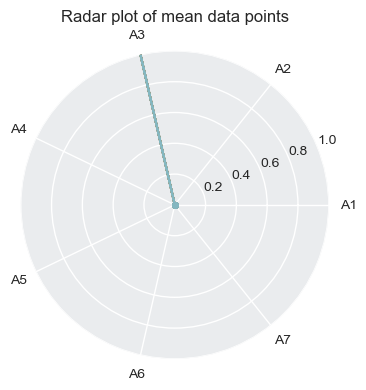

In [163]:
# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
AA = AA_list_level1[4]

out = plot_category_mean_radar(AA, level1_df, 'region', ['C' + str(i) for i in range(1,291+1)], colors = region_color, Title='Radar plot of mean data points')

C:\Users\nandy\AppData\Local\Temp\ipykernel_2872\3388555061.py:37: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(111, polar=True)


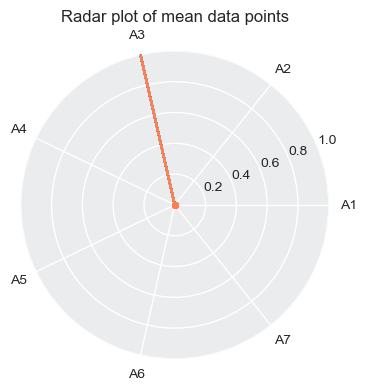

In [165]:
# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
AA = AA_list_level1[4]

colors = ['Red', 'Blue', 'Green', 'Yellow', 'Orange', 'Purple', 'Pink', 'Brown', 'Cyan', 'Magenta', 'Maroon', 'Navy', 'Olive', 'Teal', 'Lavender', 'Coral']
df_args = level1_df[['location']].copy()
df_args['color'] = colors[0]
uniq_locations = df_args['location'].unique()
color_dict = {location: color for location, color in zip(uniq_locations, colors)}

out = plot_category_mean_radar(AA, level1_df, 'location', ['C' + str(i) for i in range(1,291+1)], colors = color_dict, Title='Radar plot of mean data points')

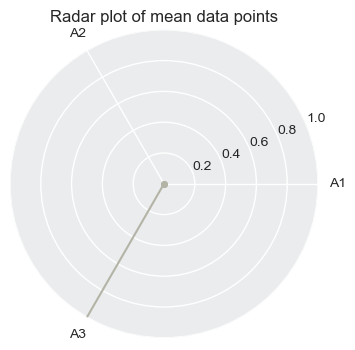

In [136]:
# Example usage:
lst_feat = ['R' + str(i) for i in range(1,913+1)]
sc = StandardScaler()
X = April_L1_LA_rates_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
AA = AA_list_la_l1_april[0]

plot_category_mean_radar(AA, April_L1_LA_rates_df, 'region', lst_feat, colors = region_color, Title='Radar plot of mean data points')

In [140]:
# # Example usage:
# lst_feat = ['C' + str(i) for i in range(1,291+1)]
# sc = StandardScaler()
# X = df[lst_feat].values #Using level1_df here
# X_scaled = sc.fit_transform(X)
# AA = AA_list[4]

# plot_category_mean_radar(AA, df, 'region', ['C' + str(i) for i in range(1,291+1)], colors = region_color, Title='Radar plot of mean data points')

In [153]:
bio = out['Biogenic']
bio

array([[5.54472319e+06, 7.26220369e+06, 3.08518345e+07, 3.97369922e+08,
        2.50738421e+09, 0.00000000e+00, 7.01363963e+10, 8.29272049e+07,
        4.59998618e+07, 0.00000000e+00, 0.00000000e+00, 2.03762261e+06,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        5.11022393e+06, 1.45623959e+09, 1.96756478e+06, 0.00000000e+00,
        0.00000000e+00, 9.28615172e+06, 3.66537930e+09, 3.43348433e+07,
        9.05523241e+09, 1.82078976e+10, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 4.59828281e+04, 7.25432007e+08, 8.60213971e+04,
        3.32491593e+08, 6.73400451e+09, 2.23809618e+08, 1.41186199e+09,
        1.66430530e+08, 3.61018544e+09, 2.53061524e+06, 2.97232109e+10,
        7.00366954e+09, 9.01967044e+06, 3.32268264e+10, 9.58854719e+10,
        2.14383625e+11, 8.79916219e+07, 1.42367327e+09, 2.394764

In [154]:
AA.transform(bio)

(array([[-4.04281325e+12, -4.34639421e+12, -4.20602481e+12,
         -6.97380559e+12, -3.04467004e+12,  0.00000000e+00,
         -5.44942160e+12, -5.38540571e+12, -4.45705905e+12,
          0.00000000e+00,  0.00000000e+00, -3.26788171e+12,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00, -3.18084608e+12,
         -5.47063437e+12, -1.64362197e+12,  0.00000000e+00,
          0.00000000e+00, -3.12348231e+12, -2.10224185e+12,
         -2.62736143e+12, -4.87148440e+12, -4.19875764e+12,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00, -1.84132509e+12,  1.91039364e+13,
         -1.67819495e+12, -2.62766451e+12,  2.21294864e+13,
         -2.42623987e+12,  2.21133467e+13,  2.14719398e+13,
          2.20892401e+13, -1.52028465e+12,  2.21452382e+13,
          1.31447333e+12, -2.79452062e+1

AttributeError: 'ArchetypalAnalysis' object has no attribute '__optimize_alfa_for_transform'

In [150]:
avg.shape

(1, 291)

In [151]:
avg

array([[9.24120531e+05, 1.21036728e+06, 5.14197241e+06, 6.62283203e+07,
        4.17897368e+08, 0.00000000e+00, 1.16893994e+10, 1.38212008e+07,
        7.66664364e+06, 0.00000000e+00, 0.00000000e+00, 3.39603768e+05,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        8.51703988e+05, 2.42706598e+08, 3.27927463e+05, 0.00000000e+00,
        0.00000000e+00, 1.54769195e+06, 6.10896550e+08, 5.72247388e+06,
        1.50920540e+09, 3.03464961e+09, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 7.66380468e+03, 1.20905334e+08, 1.43368995e+04,
        5.54152656e+07, 1.12233408e+09, 3.73016030e+07, 2.35310332e+08,
        2.77384216e+07, 6.01697573e+08, 4.21769206e+05, 4.95386848e+09,
        1.16727826e+09, 1.50327841e+06, 5.53780440e+09, 1.59809120e+10,
        3.57306042e+10, 1.46652703e+07, 2.37278879e+08, 3.991273

<PolarAxes: title={'center': 'Radar plot of datapoint index = 45'}>

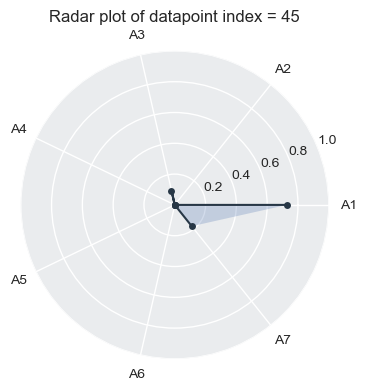

In [159]:
idx = 45
plot_radar_datapoint(AA, X_scaled[idx,:].reshape(1,-1), Title=f'Radar plot of datapoint index = {idx}')

In [178]:
# what if we get a mean point instead if mean value

import numpy as np
import matplotlib.pyplot as plt


def category_mean(AA, df, column, target_columns, colors=None, Title='Radar plot of mean data points'):
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    # Initialize an empty list to store data points
    data_points = {}
    
    # Calculate mean data point for each category
    for i, category in enumerate(categories):
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        
        # Calculate mean of the subset for target columns
#         mean_data_point = subset[target_columns].mean(axis=0).values.reshape(1,-1)
        
        # Calculate mean of the subset for target columns
        mean_values = subset[target_columns].mean(axis=0)

        # Calculate Euclidean distances between each data point and the mean
        distances = np.linalg.norm(subset[target_columns] - mean_values, axis=1)

        # Find the index of the data point with the smallest distance
        closest_index = np.argmin(distances)

        # Get the data point
#         closest_data_point = subset.iloc[closest_index][target_columns]
        
        # Append to the list of data points
#         data_points[category]=closest_data_point.values.reshape(1,-1)
        
        data_points[category] = closest_index
        
        print(closest_index)
        
    

    return data_points

# Example usage:
# plot_category_mean_radar(AA, df, 'Category_Column_Name', ['C' + str(i) for i in range(1,291+1)], Title='Radar plot of mean data points')


# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
AA = AA_list_level1[2]

data_points = category_mean(AA, level1_df, 'region', ['C' + str(i) for i in range(1,291+1)], colors = region_color, Title='Radar plot of mean data points')

283
698
1443
575
143
19


<PolarAxes: title={'center': 'Radar plot of datapoint index = 698'}>

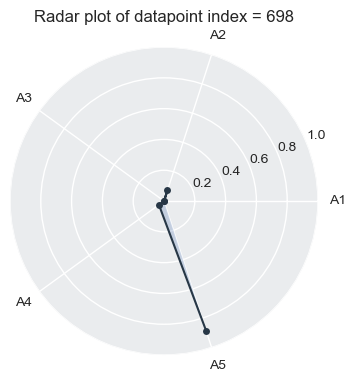

In [173]:
idx = 698
plot_radar_datapoint(AA, X_scaled[idx,:].reshape(1,-1), Title=f'Radar plot of datapoint index = {idx}')

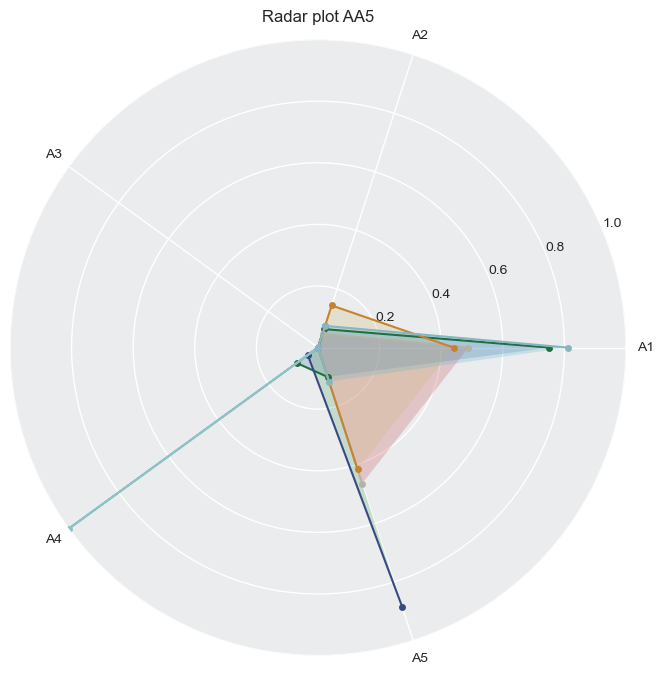

In [187]:
import numpy as np
import matplotlib.pyplot as plt

def plot_radar_datapoints(AA, X, ax=None, Title='Radar plot of datapoint', category=None):
    if ax is None:
        fig = plt.figure(figsize=(4, 4))
        ax = fig.add_subplot(111, polar=True)
    else:
        fig = ax.get_figure()

    _, alfa_X = AA.transform(X)
    
    labels = ['A' + str(i+1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint=False)
    if category:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color = region_color[category])#color='#273746')
    else:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color='#273746')
    ax.fill(angles, alfa_X, alpha=0.25)
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0, 1)
    ax.set_facecolor('#EAECEE')
    
    return ax

# Example usage:
# Create the initial figure and axis
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, polar=True)

for category, data_point in data_points.items():
    plot_radar_datapoints(AA, X_scaled[data_point,:].reshape(1,-1), ax=ax, Title='Radar plot AA'+str(AA.n_archetypes), category = category)
#     plt.show()

# # Add the first radar plot
# plot_radar_datapoints(AA, X, ax=ax, Title='Radar plot 1')

# # Add another radar plot
# plot_radar_datapoints(AA, X2, ax=ax, Title='Radar plot 2')

# # Keep adding more radar plots as needed
# plot_radar_datapoints(AA, X3, ax=ax, Title='Radar plot 3')

plt.show()

283
698
1443
575
143
19


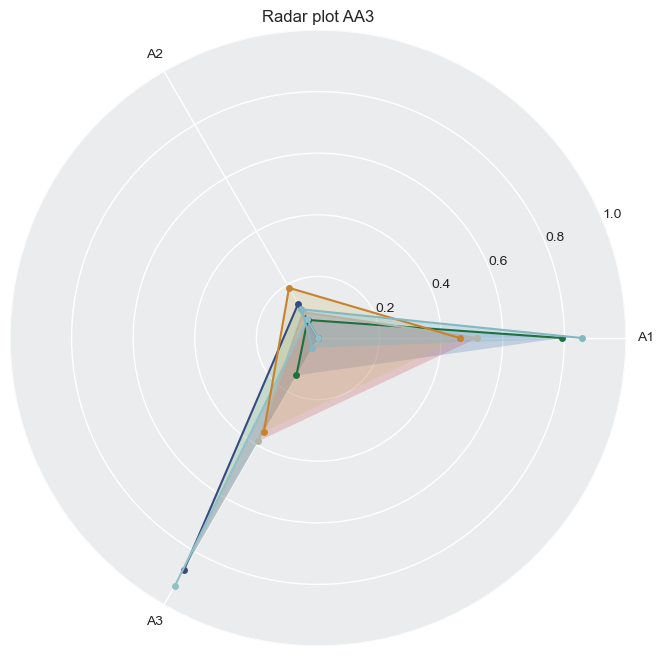

283
698
1443
575
143
19


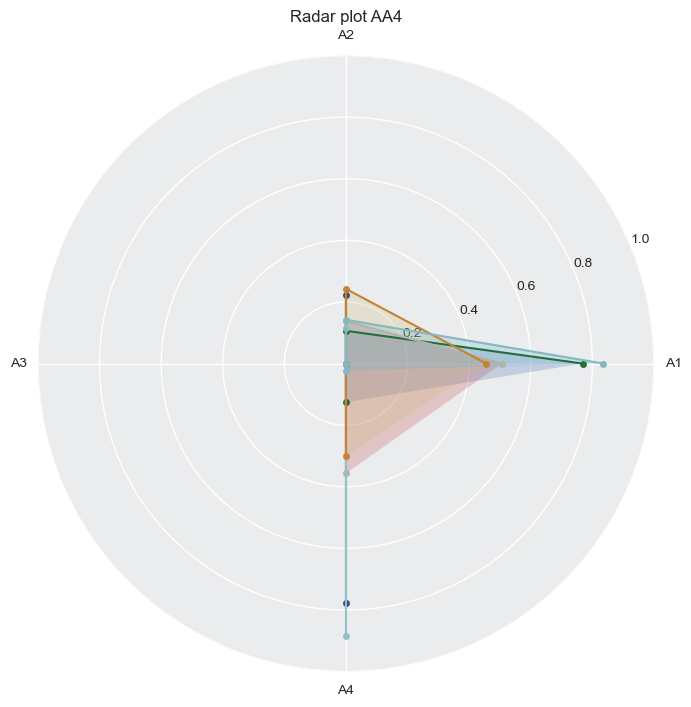

283
698
1443
575
143
19


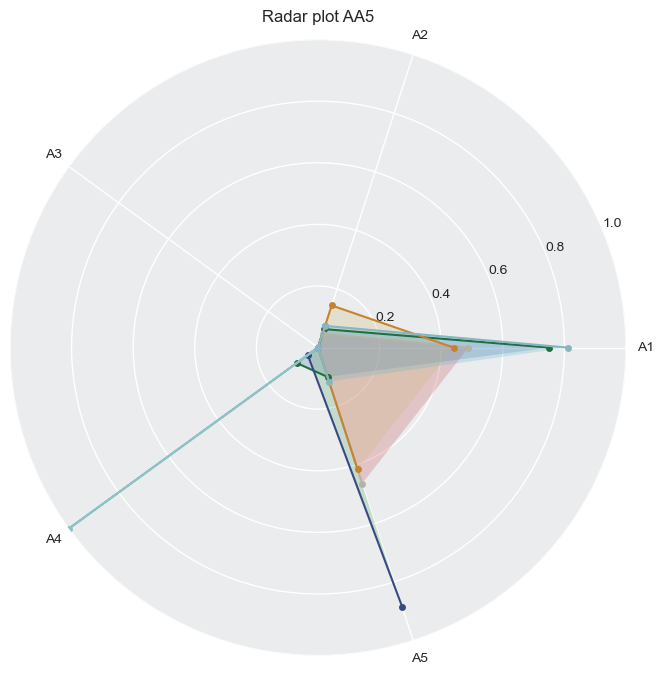

283
698
1443
575
143
19


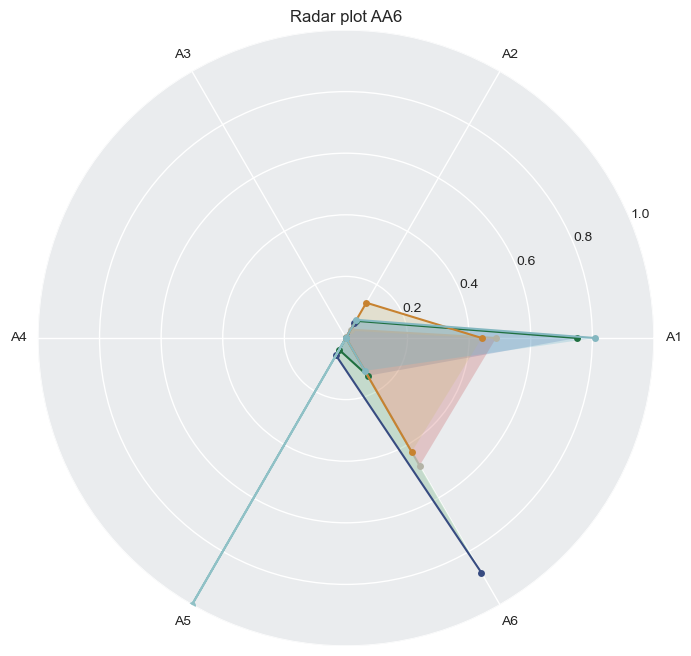

283
698
1443
575
143
19


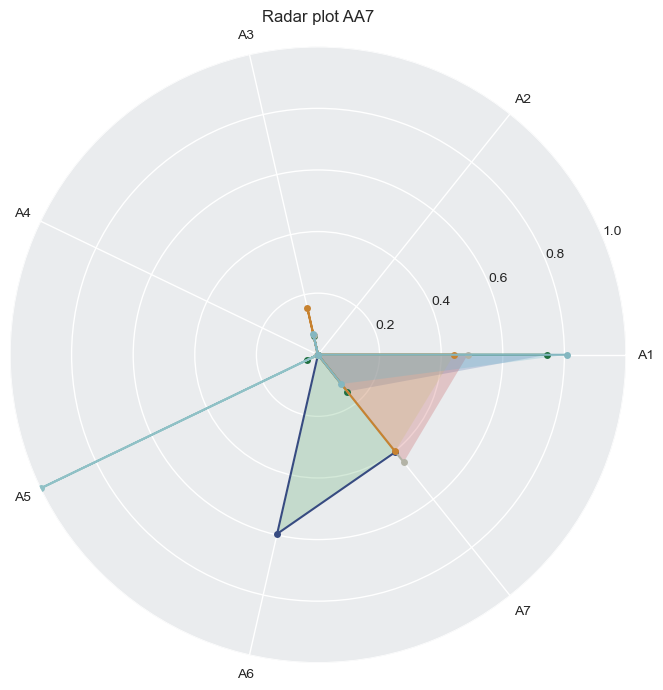

283
698
1443
575
143
19


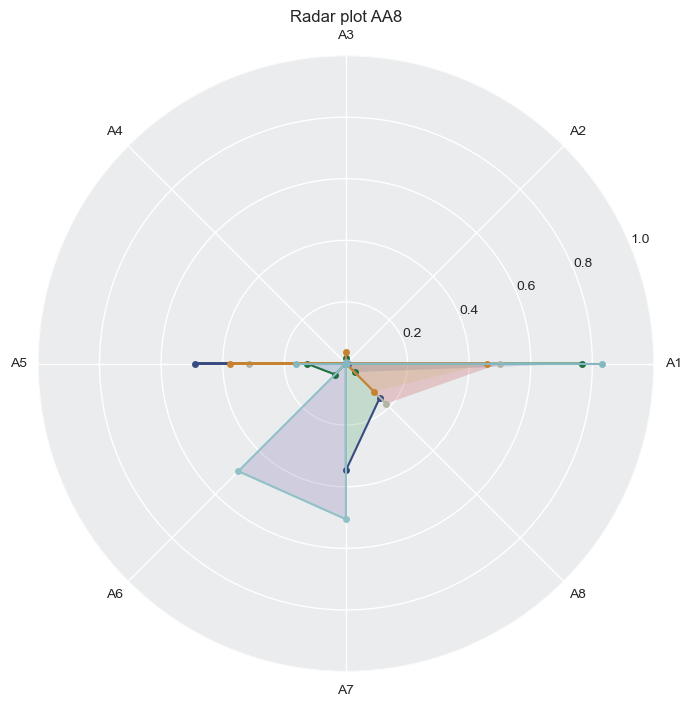

In [188]:
def category_mean(AA, df, column, target_columns, colors=None, Title='Radar plot of mean data points'):
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    # Initialize an empty list to store data points
    data_points = {}
    
    # Calculate mean data point for each category
    for i, category in enumerate(categories):
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        
        # Calculate mean of the subset for target columns
        mean_values = subset[target_columns].mean(axis=0)

        # Calculate Euclidean distances between each data point and the mean
        distances = np.linalg.norm(subset[target_columns] - mean_values, axis=1)

        # Find the index of the data point with the smallest distance
        closest_index = np.argmin(distances)
        
        data_points[category] = closest_index
              
    return data_points

def plot_radar_datapoints(AA, X, ax=None, Title='Radar plot of datapoint', category=None):
    if ax is None:
        fig = plt.figure(figsize=(4, 4))
        ax = fig.add_subplot(111, polar=True)
    else:
        fig = ax.get_figure()

    _, alfa_X = AA.transform(X)
    
    labels = ['A' + str(i+1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint=False)
    if category:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color = region_color[category])#color='#273746')
    else:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color='#273746')
    ax.fill(angles, alfa_X, alpha=0.25)
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0, 1)
    ax.set_facecolor('#EAECEE')
    
    return ax

# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
# AA = AA_list_level1[2]

for AA in AA_list_level1:
    data_points = category_mean(AA, level1_df, 'region', ['C' + str(i) for i in range(1,291+1)], colors = region_color, Title='Radar plot of mean data points')


    # Example usage:
    # Create the initial figure and axis
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for category, data_point in data_points.items():
        plot_radar_datapoints(AA, X_scaled[data_point,:].reshape(1,-1), ax=ax, Title='Radar plot AA'+str(AA.n_archetypes), category = category)

    plt.show()

# Mean

In [190]:
# what if we get a median point instead if mean value

import numpy as np
import matplotlib.pyplot as plt


def category_mean_value(AA, df, column, target_columns, colors=None, Title='Radar plot of mean data points'):
    sc = StandardScaler()
    
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    # Initialize an empty list to store data points
    data_points = {}
    
    # Calculate mean data point for each category
    for i, category in enumerate(categories):
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        
        X = subset[target_columns].values #Using level1_df here
        X_scaled = sc.fit_transform(X)
        
        # Calculate mean of the subset for target columns
        mean_data_point = np.mean(X_scaled, axis=0).reshape(1, -1)
        
        data_points[category] = mean_data_point    
    

    return data_points

# Example usage:
# plot_category_mean_radar(AA, df, 'Category_Column_Name', ['C' + str(i) for i in range(1,291+1)], Title='Radar plot of mean data points')


# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
AA = AA_list_level1[2]

data_points = category_mean_value(AA, level1_df, 'region', ['C' + str(i) for i in range(1,291+1)], colors = region_color, Title='Radar plot of mean data points')

283
698
1443
575
143
19


ValueError: not enough values to unpack (expected 2, got 0)

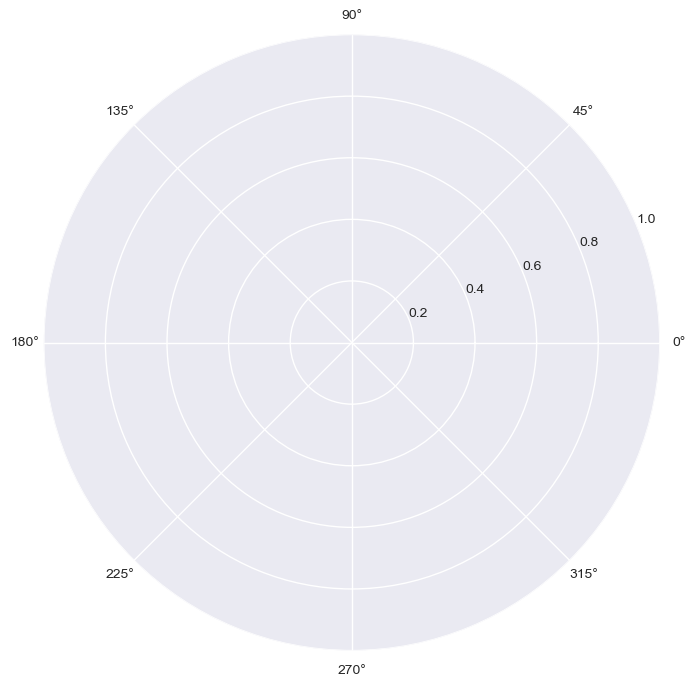

In [191]:
# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
# AA = AA_list_level1[2]

for AA in AA_list_level1:
    data_points = category_mean(AA, level1_df, 'region', ['C' + str(i) for i in range(1,291+1)], colors = region_color, Title='Radar plot of mean data points')


    # Example usage:
    # Create the initial figure and axis
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for category, data_point in data_points.items():
        plot_radar_datapoints(AA, data_point, ax=ax, Title='Radar plot AA'+str(AA.n_archetypes), category = category)

    plt.show()

In [192]:
plot_args

{'color': [(0.826588, 0.315714, 0.441316, 1.0),
  (0.794549, 0.27577, 0.473117, 1.0),
  (0.764193, 0.240396, 0.502126, 1.0),
  (0.72767, 0.200586, 0.535293, 1.0),
  (0.69284, 0.165141, 0.564522, 1.0),
  (0.697324, 0.169573, 0.560919, 1.0),
  (0.731862, 0.205013, 0.531601, 1.0),
  (0.764193, 0.240396, 0.502126, 1.0),
  (0.798216, 0.280197, 0.469538, 1.0),
  (0.826588, 0.315714, 0.441316, 1.0),
  (0.956808, 0.928152, 0.152409, 1.0),
  (0.964021, 0.90795, 0.14937, 1.0),
  (0.970533, 0.887896, 0.145919, 1.0),
  (0.977995, 0.861432, 0.142808, 1.0),
  (0.985314, 0.828846, 0.142945, 1.0),
  (0.990439, 0.796859, 0.14787, 1.0),
  (0.993482, 0.765499, 0.156891, 1.0),
  (0.994553, 0.728728, 0.171622, 1.0),
  (0.993032, 0.692907, 0.189084, 1.0),
  (0.989128, 0.658043, 0.2081, 1.0),
  (0.981826, 0.618572, 0.231287, 1.0),
  (0.971835, 0.580382, 0.254931, 1.0),
  (0.959424, 0.543431, 0.278701, 1.0),
  (0.942598, 0.502639, 0.305816, 1.0),
  (0.923287, 0.463251, 0.332801, 1.0),
  (0.901807, 0.425087, 0

In [193]:
color_dict

{'Amazon': 'Red',
 'AtlanticOcean': 'Blue',
 'Beijing': 'Green',
 'Borneo': 'Yellow',
 'CapeGrim': 'Orange',
 'Congo': 'Purple',
 'ElDjouf': 'Pink',
 'Graciosa': 'Brown',
 'IndianOcean': 'Cyan',
 'Kinshasa': 'Magenta',
 'LosAngeles': 'Maroon',
 'McMurdo': 'Navy',
 'Ozarks': 'Olive',
 'PacificOcean': 'Teal',
 'Paris': 'Lavender',
 'Utqiagvik': 'Coral'}

In [194]:
AA3 = AA_list_level1[0]
plot_simplex(AA3.n_archetypes, AA3.alfa, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = True)

TypeError: plot_simplex() missing 1 required positional argument: 'color_vertex'

# Tetrahedron

In [174]:
AA4 = AA_list_level1[1]

ValueError: shapes (4,6144) and (3,2) not aligned: 6144 (dim 1) != 3 (dim 0)

AttributeError: 'NoneType' object has no attribute 'keys'

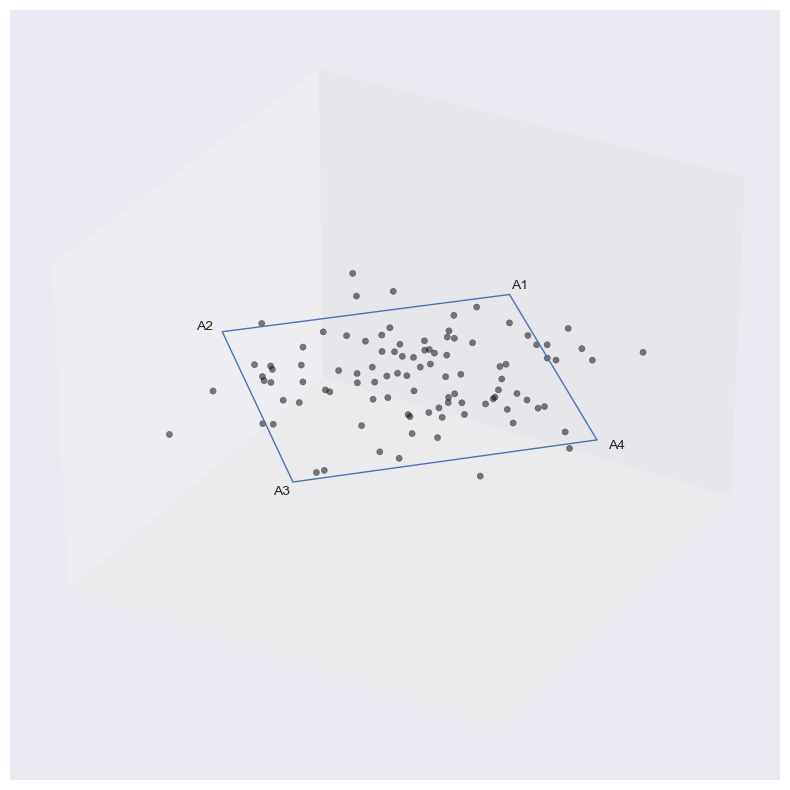

In [177]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_simplex_3d(n_archetypes, alfa, color_vertex=None, plot_args={}, grid_on=True, cmap='viridis', categorical=True, legend_color=None, label=True):
    vertex_colors = ['red', 'blue', 'green', 'yellow']
    labels = ('A'+str(i + 1) for i in range(n_archetypes))
    rotate_labels = True
    label_offset = 0.10
    data = alfa.T
    scaling = False
    sides = n_archetypes
    basis = np.array(
        [
            [
                np.cos(2*_*np.pi/sides + 90*np.pi/180),
                np.sin(2*_*np.pi/sides + 90*np.pi/180),
                0
            ] 
            for _ in range(sides)
        ]
    )     

    # If data is Nxsides, newdata is Nx3.
    if scaling:
        # Scales data for you.
        newdata = np.dot((data.T / data.sum(-1)).T, basis)
    else:
        # Assumes data already sums to 1.
        newdata = np.dot(data, basis)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    for i, l in enumerate(labels):
        if i >= sides:
            break
        x = basis[i, 0]
        y = basis[i, 1]
        z = basis[i, 2]
        if rotate_labels:
            angle = 180*np.arctan(y/x)/np.pi + 90
            if angle > 90 and angle <= 270:
                angle = (angle + 180) % 360
        else:
            angle = 0
        ax.text(
            x*(1 + label_offset),
            y*(1 + label_offset),
            z*(1 + label_offset),
            l,
            horizontalalignment='center',
            verticalalignment='center',
            rotation=angle
        )

    # Clear normal matplotlib axes graphics.
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_zticks(())
    ax.set_frame_on(False)

    # Plot border
    lst_ax_0 = []
    lst_ax_1 = []
    lst_ax_2 = []
    for _ in range(sides):
        lst_ax_0.append(basis[_, 0])
        lst_ax_1.append(basis[_, 1])
        lst_ax_2.append(basis[_, 2])

    lst_ax_0.append(basis[0, 0])
    lst_ax_1.append(basis[0, 1])
    lst_ax_2.append(basis[0, 2])

    ax.plot(lst_ax_0, lst_ax_1, lst_ax_2, linewidth=1, zorder=2) 
    
    # Plot vertices
    if color_vertex:
        for i in range(len(color_vertex)):
            v = color_vertex[i]
            ax.scatter(basis[v, 0], basis[v, 1], basis[v, 2], color=vertex_colors[i], s=200, zorder=4)

    if len(plot_args) == 0:
        ax.scatter(newdata[:, 0], newdata[:, 1], newdata[:, 2], color='black', zorder=3, alpha=0.5)
    else:
        if ('marker' in plot_args):   
            marker_vals = plot_args['marker'].values
            marker_unq = np.unique(marker_vals)                
            
            for marker in marker_unq:
                row_idx = np.where(marker_vals == marker)
                tmp_arg = {}
                for keys in plot_args:
                    if (keys!= 'marker'):
                        tmp_arg[keys] = plot_args[keys].values[row_idx]
                
                ax.scatter(newdata[row_idx,0],newdata[row_idx,1], newdata[row_idx,2], **tmp_arg, marker =  marker, alpha=0.5, zorder=3)
        else:
            if categorical:
                ax.scatter(newdata[:, 0], newdata[:, 1], newdata[:, 2], **plot_args, marker='s', zorder=3, alpha=0.5)
            else:
                values = legend_color
                # Normalize the values
                norm = plt.Normalize(vmin=min(values), vmax=max(values))
                # Choose a colormap
                cmap = plt.cm.get_cmap(cmap)
                # Map each normalized value to a color
                colors = [cmap(norm(value)) for value in values]
                plot_args['color'] = colors
                
                ax.scatter(newdata[:, 0], newdata[:, 1], newdata[:, 2], **plot_args, marker='s', zorder=3, alpha=0.5)
                
        
    if label:    
        # Add color bar if numerical data
        if not categorical:

            values = legend_color
            # Normalize the values
            norm = plt.Normalize(vmin=min(values), vmax=max(values))

            # Create a ScalarMappable object using a colormap and the normalized values
            scalar_map = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

            # Create an inset axis for the colorbar
            cb_ax = ax.inset_axes([1.15, 0.5, 0.05, 0.4])  # Adjust the position and size as needed

            # Add the colorbar to the inset axis
            colorbar = plt.colorbar(scalar_map, cax=cb_ax, orientation='vertical', label=label)

            # Adjust colorbar properties
            colorbar.minorticks_on()  # Show minor ticks
            colorbar.alpha = 0.5  # Set transparency


        else:
            legend_labels =  legend_color.keys() # Update with actual labels
            legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in legend_color.values()]
    #         ax.legend(legend_handles, legend_labels, loc='lower right')
            ax.legend(legend_handles, legend_labels, loc='lower right', bbox_to_anchor=(1.15, 0.5))

    plt.show()

# Example usage
alfa = np.random.rand(4, 100)  # Sample data, replace with your data
plot_simplex_3d(4, alfa)


In [196]:
AA.alfa.shape

(8, 6144)

In [198]:
level1_df

,location,timestamp,longitude,latitude,level,temperature,pressure,air_number_density,average_water,cloud_fraction,...,K906,K907,K908,K909,K910,K911,K912,K913,twilight,region
filename,,,,,,,,,,,,,,,,,,,,,
AmazonTwilight_L1_20180101_2145.txt,Amazon,2018/01/01 21:45,-62.3631,-3.071,1,300.72,993.7992,2.351000e+19,0.034260,0.0000,...,6.739687e-08,3.204034e-06,1.289374e-06,2.304834e-07,9.733990e-07,2.304834e-07,2.304834e-07,9.266693e-07,True,Biogenic
AmazonTwilight_L1_20180101_2200.txt,Amazon,2018/01/01 22:00,-62.3631,-3.071,1,300.79,993.9504,2.353000e+19,0.032070,0.0000,...,2.341813e-08,1.118262e-06,4.393628e-07,8.296723e-08,3.412949e-07,8.296723e-08,8.296723e-08,3.151735e-07,True,Biogenic
AmazonTwilight_L1_20180101_2215.txt,Amazon,2018/01/01 22:15,-62.3631,-3.071,1,300.76,993.8056,2.353000e+19,0.031900,0.0000,...,3.581853e-09,1.669124e-07,6.822051e-08,1.362039e-08,5.041915e-08,1.362039e-08,1.362039e-08,4.899470e-08,True,Biogenic
AmazonTwilight_L1_20180101_2230.txt,Amazon,2018/01/01 22:30,-62.3631,-3.071,1,300.69,993.9412,2.354000e+19,0.031920,0.0000,...,1.196162e-10,5.567372e-09,2.289403e-09,4.254077e-10,1.681333e-09,4.254077e-10,4.254077e-10,1.648055e-09,True,Biogenic
AmazonTwilight_L1_20180102_0930.txt,Amazon,2018/01/02 09:30,-62.3631,-3.071,1,296.97,995.7482,2.389000e+19,0.030710,0.8907,...,3.019319e-11,1.440609e-09,5.739667e-10,1.174286e-10,4.376940e-10,1.174286e-10,1.174286e-10,4.105694e-10,True,Biogenic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Utqiagvik_L1_20181001_1945.txt,Utqiagvik,2018/10/01 19:45,-156.9671,71.274,1,274.11,1010.8470,2.664000e+19,0.005853,0.0000,...,2.594007e-07,1.175220e-05,5.191816e-06,8.635049e-07,3.492159e-06,8.635049e-07,8.635049e-07,3.757988e-06,False,Almost Polar
Utqiagvik_L1_20181001_2000.txt,Utqiagvik,2018/10/01 20:00,-156.9671,71.274,1,274.23,1010.7416,2.662000e+19,0.005867,0.0000,...,2.873300e-07,1.296235e-05,5.763990e-06,9.502752e-07,3.845578e-06,9.502752e-07,9.502752e-07,4.175026e-06,False,Almost Polar
Utqiagvik_L1_20181001_2015.txt,Utqiagvik,2018/10/01 20:15,-156.9671,71.274,1,274.35,1010.6275,2.661000e+19,0.005885,0.0000,...,3.139810e-07,1.410848e-05,6.310647e-06,1.031850e-06,4.179527e-06,1.031850e-06,1.031850e-06,4.573945e-06,False,Almost Polar


In [202]:
import numpy as np
import plotly.graph_objects as go


AA = AA_list_la_l1_april[0]

# Given array
arr = AA.alfa

# Initialize lists to store values for each column
col1, col2, col3 = AA.alfa[0],AA.alfa[1],AA.alfa[2]

# Print the lists for each column
print("Column 1:", col1)
print("Column 2:", col2)
print("Column 3:", col3)



# Create 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=col1, y=col2, z=col3, mode='markers', marker=dict(size=5))])

# Set axis labels
fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))

# Show plot
fig.show()

Column 1: [0.1425634  0.11609131 0.10467021 0.08292744 0.05119547 0.
 0.         0.         0.         0.         1.00000161 1.0000017
 1.00000149 1.00000019 0.98629669 0.9439377  0.88680648 0.85375187
 0.7925052  0.71265658 0.64290603 0.57372121 0.50004588 0.4298687
 0.35658199 0.28767946 0.22889029 0.18048157 0.03002369 0.01675272
 0.00983237 0.00615976 0.00422609 0.00285361 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.03295998 0.07888485 0.12414845 0.18107612 0.23584673 0.31197131
 0.37602956 0.44327884 0.51771313 0.59312603 0.67189477 0.75921315
 0.84022638 0.91973423 0.98372103 1.00000194 1.00000312 1.0